In [2]:
import os
from os.path import join
import sys
import pandas as pd
import numpy as np
import pickle as pkl
import seaborn as sns
import matplotlib.pyplot as plt
sys.path.append('/n/home12/binxuwang/Github/DiffusionReasoning')

In [3]:
from eval_memorization_utils import eval_memorization_all_level_sample_tsr, get_RAVEN_dataset, extract_row_mat_set, extract_panel_mat_set, extract_attr_row_mat_set, extract_attr_panel_mat_set, \
    compute_memorization_tab_through_training, visualize_memorization_dynamics, visualize_memorization_with_ctrl_dynamics, compute_memorization_binary_joint, extract_training_set_row_panel_sets
from posthoc_analysis_utils import sweep_collect_sample, sweep_collect_eval_data, extract_rule_list_from_eval_col, format_rule_list_to_mat, extract_and_convert
from stats_plot_utils import estimate_CI, shaded_error, saveallforms, shaded_error, add_rectangles

In [4]:
def visualize_memorization_with_ctrl_dynamics(mem_stats_df, mem_stats_ctrl_df, expname=''):
    figh, axs = plt.subplots(1, 2, figsize=(10, 6))
    plt.sca(axs[0])
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_rowfrac", label="full row")   
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr0_rowfrac", label="row attr0")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr1_rowfrac", label="row attr1")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr2_rowfrac", label="row attr2")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_samplefrac", label="full sample")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_rowfrac", label="full row (ctrl)", linestyle=':', color="C0")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr0_rowfrac", label="row attr0 (ctrl)", linestyle=':', color="C1")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr1_rowfrac", label="row attr1 (ctrl)", linestyle=':', color="C2")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr2_rowfrac", label="row attr2 (ctrl)", linestyle=':', color="C3")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_samplefrac", label="ctrl sample (ctrl)", linestyle=':', color="C4")
    plt.title("Row memorization fraction")
    plt.ylabel("row fraction")
    plt.xlabel("step")
    plt.legend()
    plt.sca(axs[1])
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_panfrac", label="full panel")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr0_panfrac", label="panel attr0")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr1_panfrac", label="panel attr1")
    sns.lineplot(data=mem_stats_df, x="epoch", y="mem_attr2_panfrac", label="panel attr2")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_panfrac", label="full panel (ctrl)", linestyle=':', color="C0")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr0_panfrac", label="panel attr0 (ctrl)", linestyle=':', color="C1")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr1_panfrac", label="panel attr1 (ctrl)", linestyle=':', color="C2")
    sns.lineplot(data=mem_stats_ctrl_df, x="epoch", y="mem_attr2_panfrac", label="panel attr2 (ctrl)", linestyle=':', color="C3")
    plt.title("Panel memorization fraction")
    plt.ylabel("panel fraction")
    plt.xlabel("step")
    plt.legend()
    plt.suptitle(f"Memorization of training set at various level\n{expname}")
    # saveallforms(figexpdir, "memorization_levels_dynamics", figh)
    plt.show()
    return figh

## GPT memorization

In [5]:
figroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics"
tabdir = "/n/home12/binxuwang/Github/DiffusionReasoning/Tables"
GPT_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/GPT2_raven"
DiT_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results"
SSM_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/Mamba_raven"
EDM_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/mini_edm/exps"
memroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/Figure_memorization_inspection"
GPTmemroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics"

memsyndir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/synopsis'

GPT2_base_RAVEN_uncond_heldout0_stream0_16M-20240820-024013 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_base_RAVEN_uncond_heldout0_stream0_16M-20240820-024013/memorization_stats_train_set.csv with 401 rows.


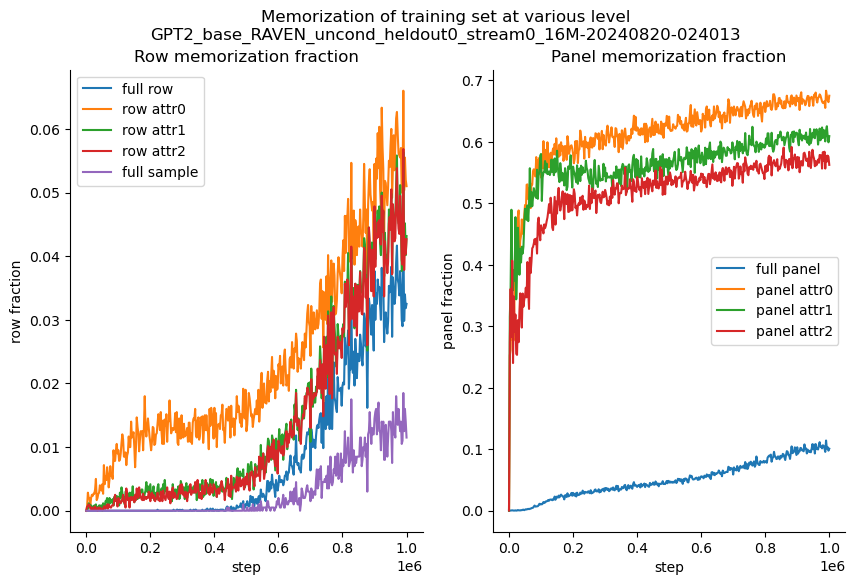

GPT2_small_RAVEN_uncond_heldout0_stream0_016M-20240820-024539 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_small_RAVEN_uncond_heldout0_stream0_016M-20240820-024539/memorization_stats_train_set.csv with 401 rows.


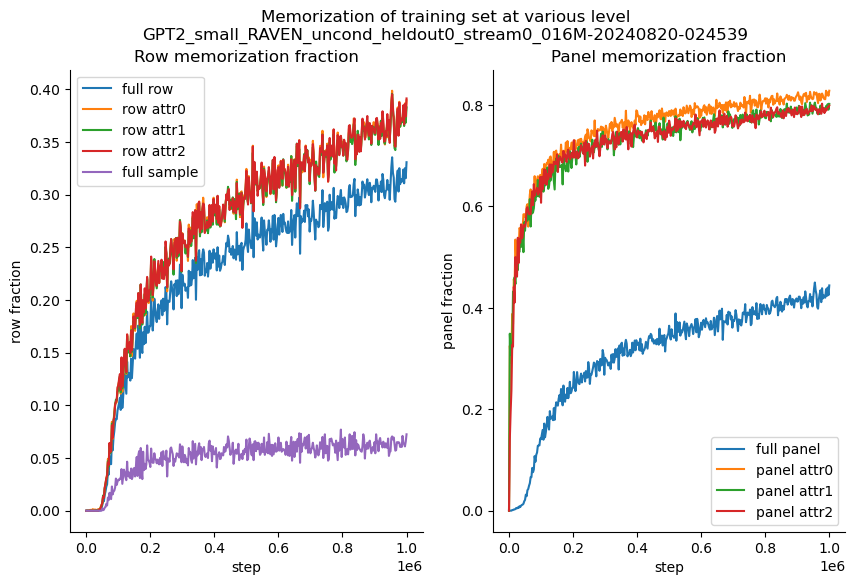

GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019/memorization_stats_train_set.csv with 401 rows.


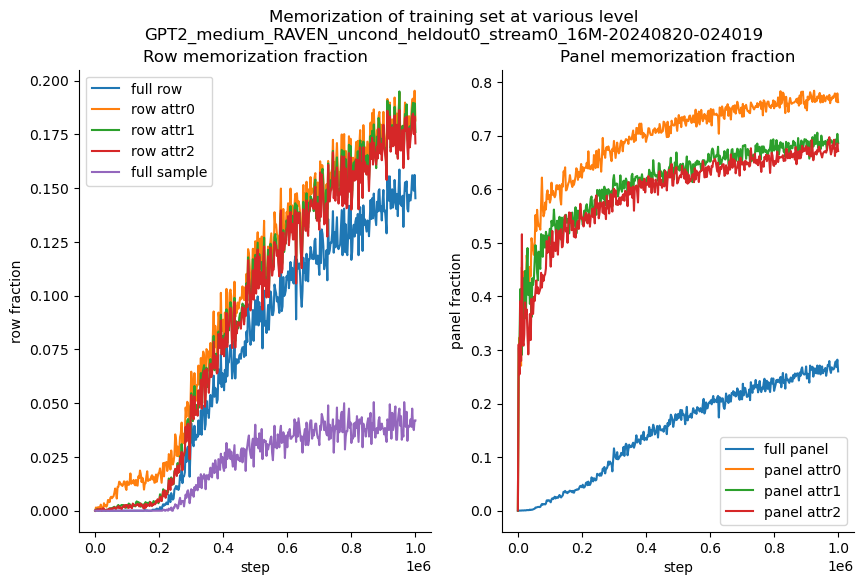

GPT2_base_RAVEN_uncond_heldout0_stream1_6M-20240820-023925 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_base_RAVEN_uncond_heldout0_stream1_6M-20240820-023925/memorization_stats_train_set.csv with 401 rows.


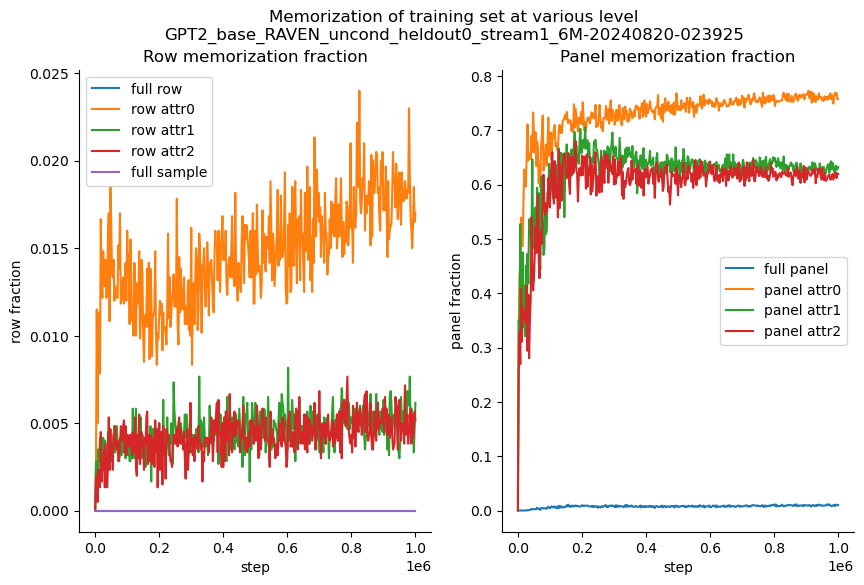

GPT2_small_RAVEN_uncond_heldout0_stream1_6M-20240818-013943 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_small_RAVEN_uncond_heldout0_stream1_6M-20240818-013943/memorization_stats_train_set.csv with 401 rows.


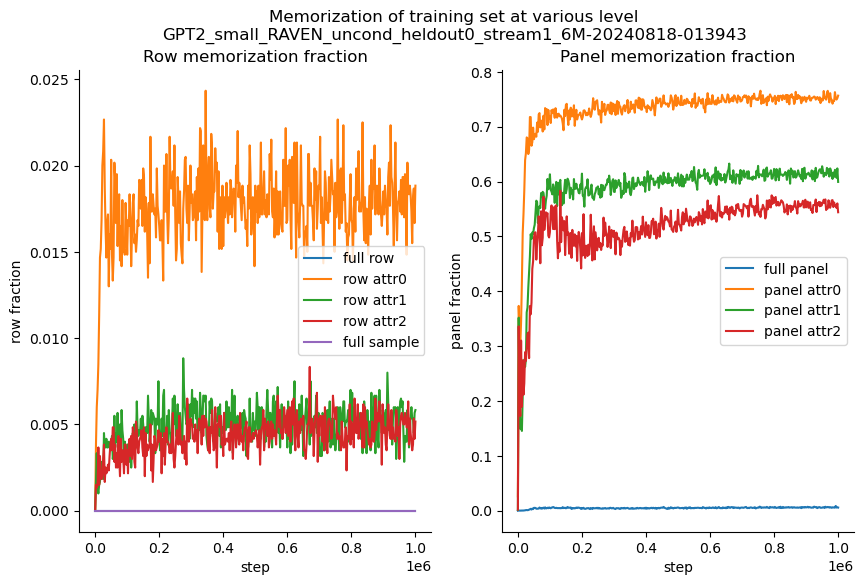

GPT2_medium_RAVEN_uncond_heldout0_stream0_016M-20240820-024735 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_medium_RAVEN_uncond_heldout0_stream0_016M-20240820-024735/memorization_stats_train_set.csv with 401 rows.


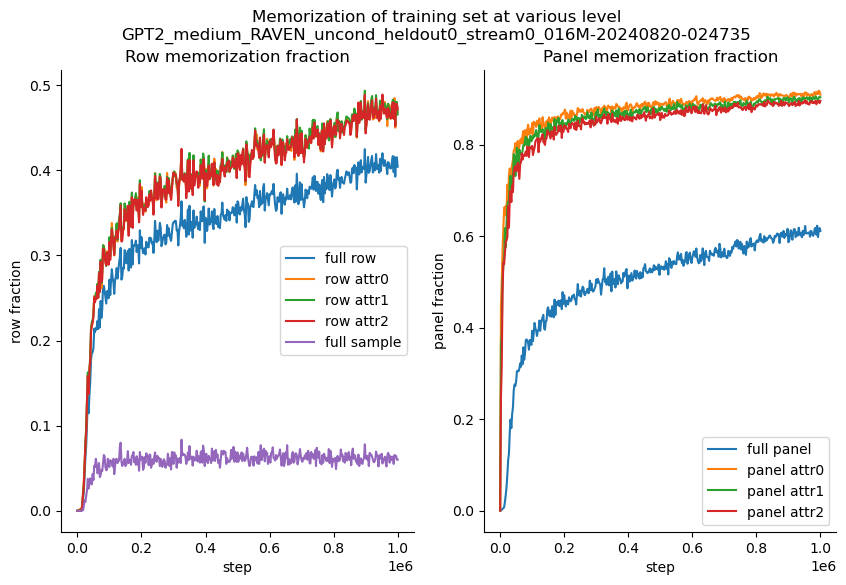

GPT2_base_RAVEN_uncond_heldout0_stream0_016M-20240820-023934 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_base_RAVEN_uncond_heldout0_stream0_016M-20240820-023934/memorization_stats_train_set.csv with 401 rows.


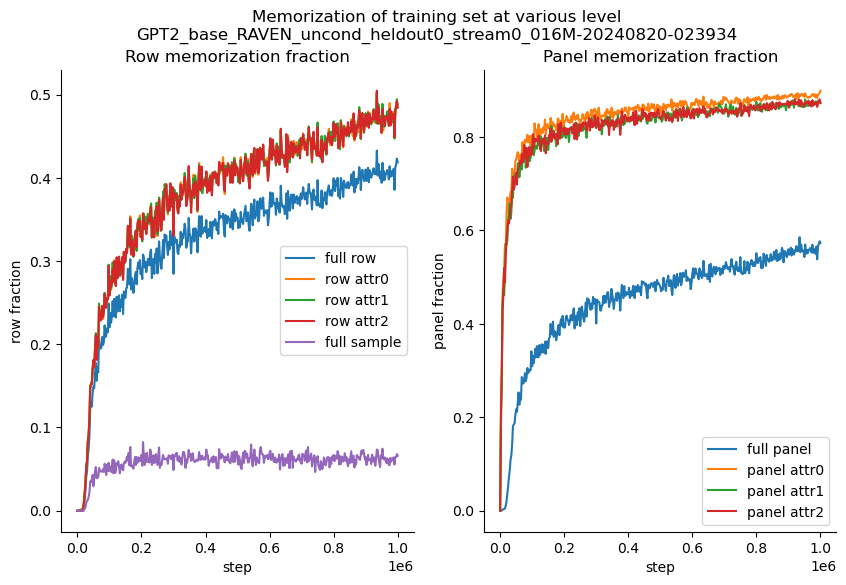

GPT2_medium_RAVEN_uncond_heldout0_stream1_6M-20240820-023917 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_medium_RAVEN_uncond_heldout0_stream1_6M-20240820-023917/memorization_stats_train_set.csv with 401 rows.


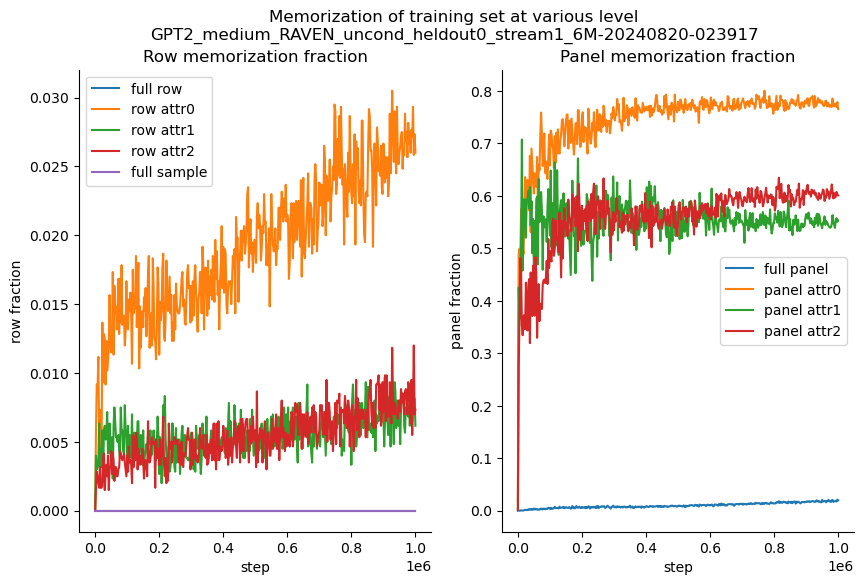

GPT2_small_RAVEN_uncond_heldout0_stream0_16M-20240820-024128 Read /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/GPT2_small_RAVEN_uncond_heldout0_stream0_16M-20240820-024128/memorization_stats_train_set.csv with 401 rows.


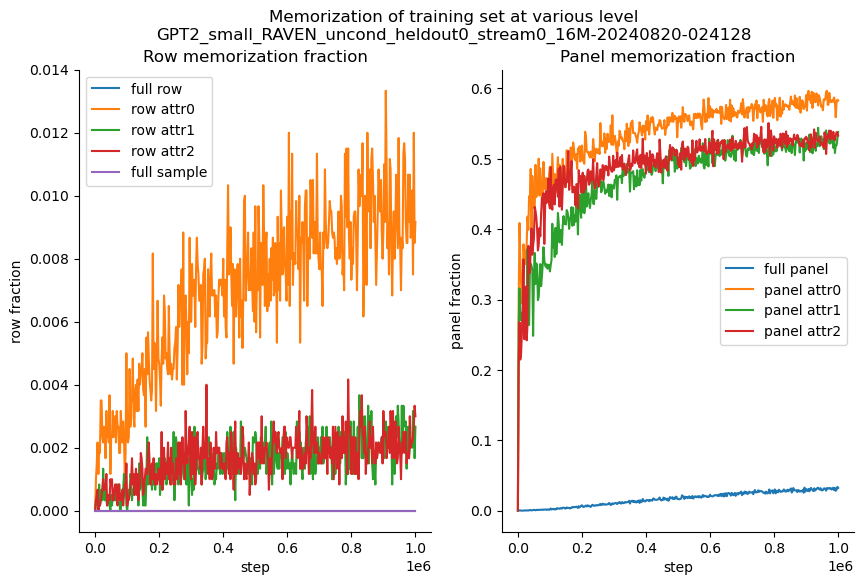

In [12]:

# Define the root directory
# Iterate through all subdirectories and files
for figexpdir, _, files in os.walk(GPTmemroot):
    # Get the experiment name
    expname = os.path.basename(figexpdir)
    for file in files:
        if file.endswith('train_set.csv'):
            file_path = os.path.join(figexpdir, file)
            # Read the CSV file
            mem_stats_df = pd.read_csv(file_path)
            # Process the data as needed
            print(f"{expname} Read {file_path} with {len(mem_stats_df)} rows.")
            figh = visualize_memorization_dynamics(mem_stats_df, expname=expname)
            saveallforms(figexpdir, "memorization_dynamics_train_set", figh)

### Visualize memorization fraction with control 

Skipping memorization_dynamics


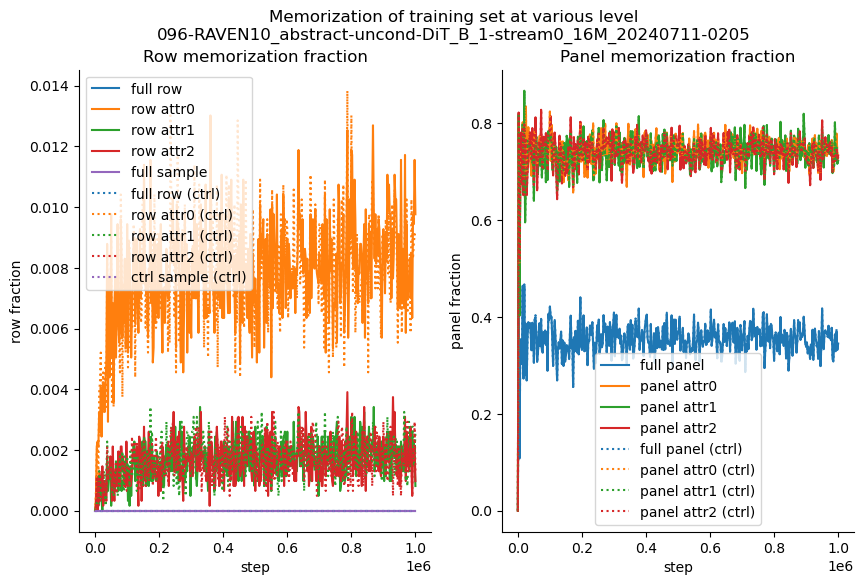

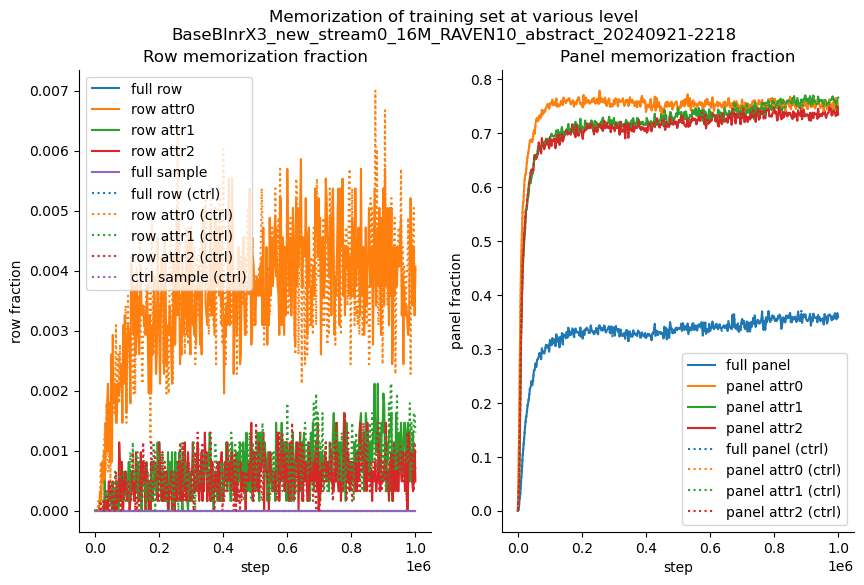

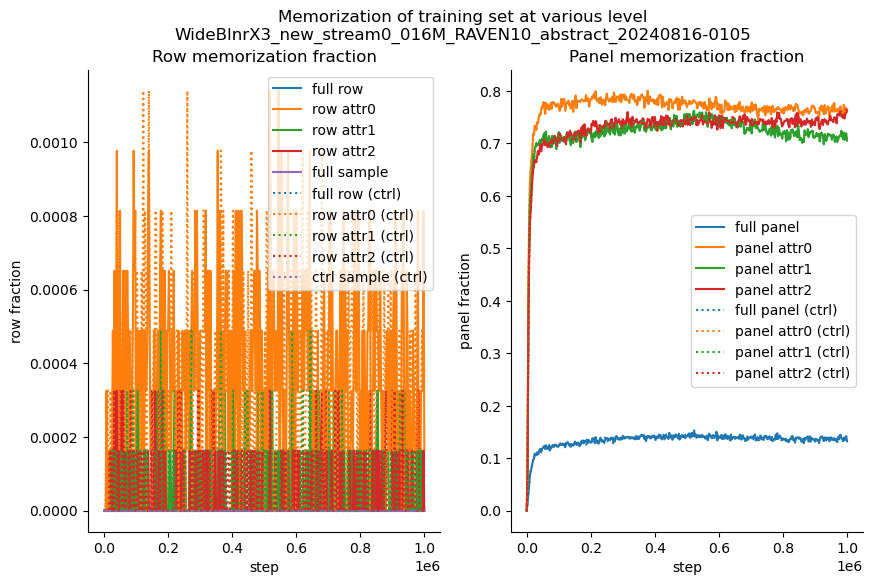

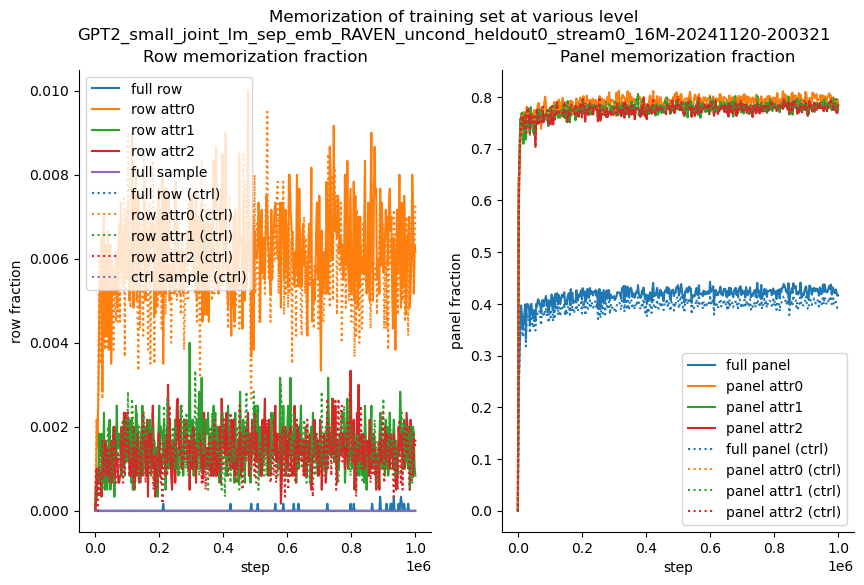

Skipping GPT2_medium_RAVEN_uncond_heldout0_stream16M-20240820-024718
Skipping GPT2_small_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream16M-20241121-140316


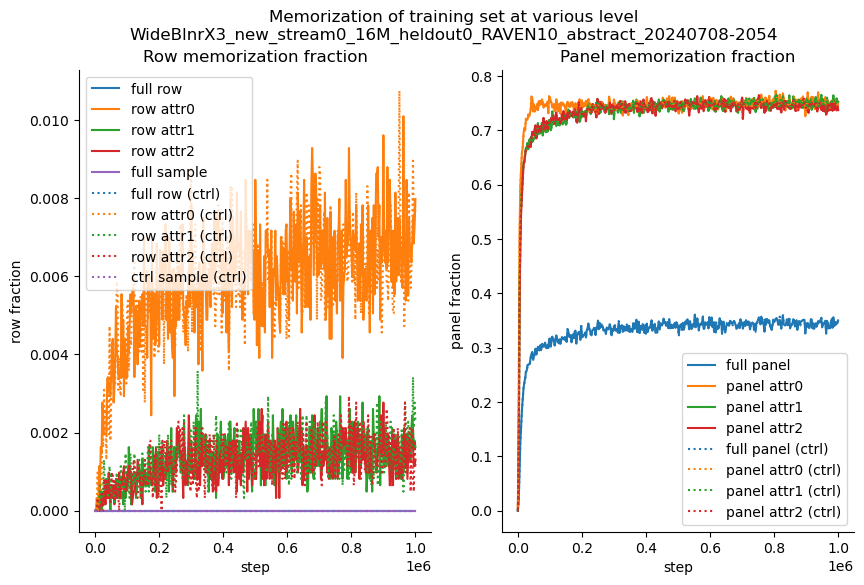

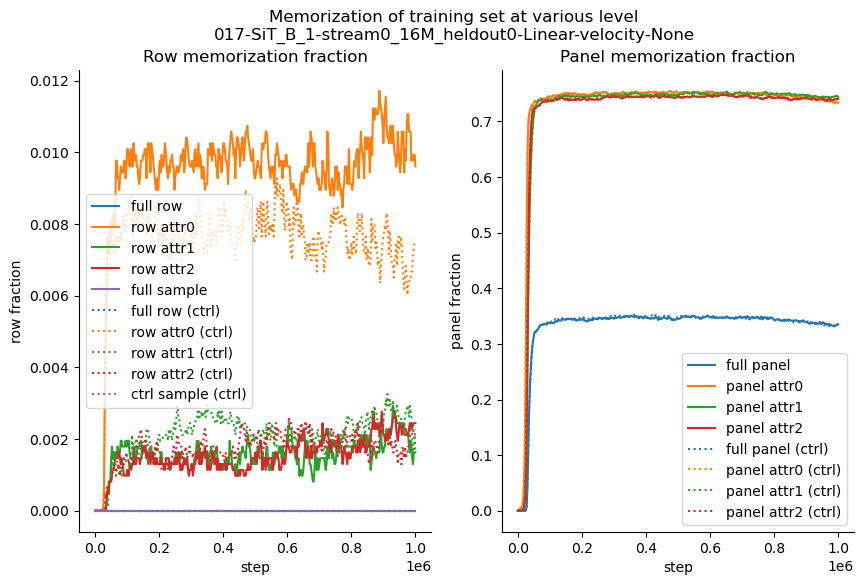

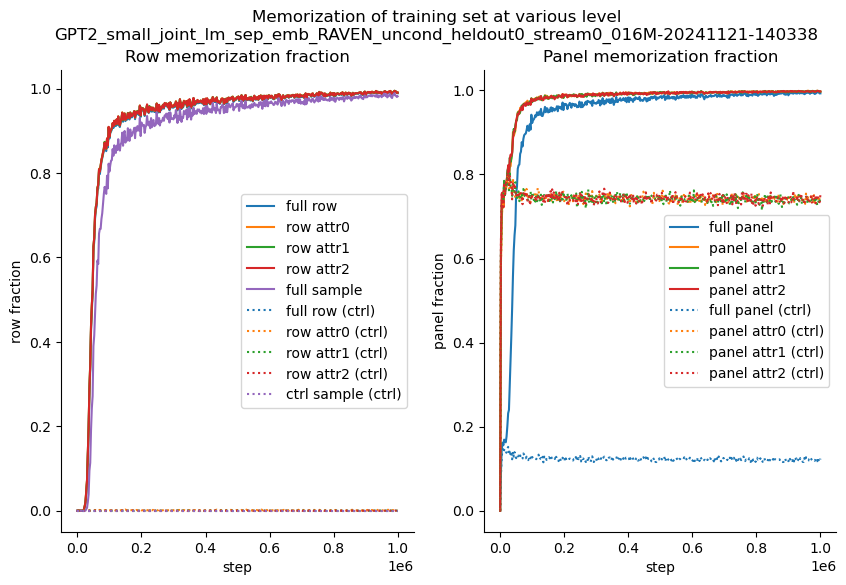

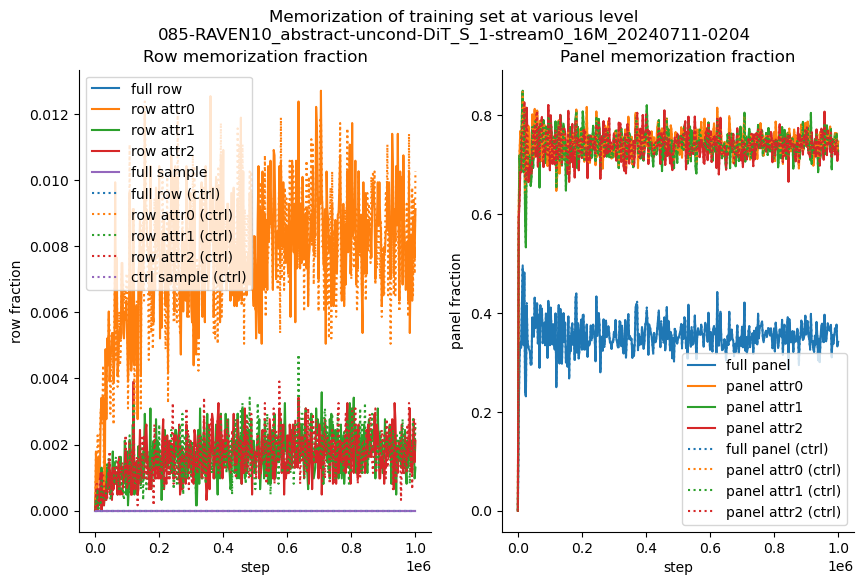

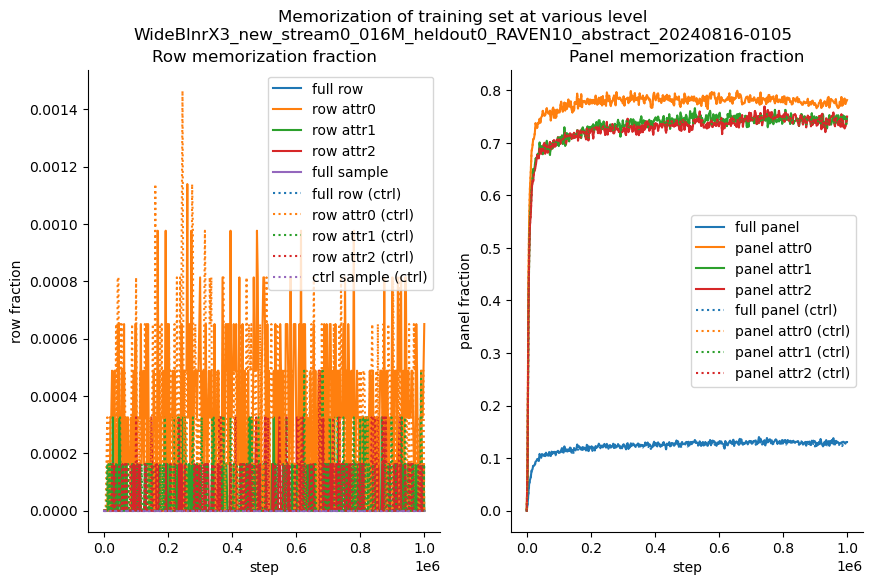

Skipping GPT2_small_RAVEN_uncond_heldout0_stream16M-20240820-024127


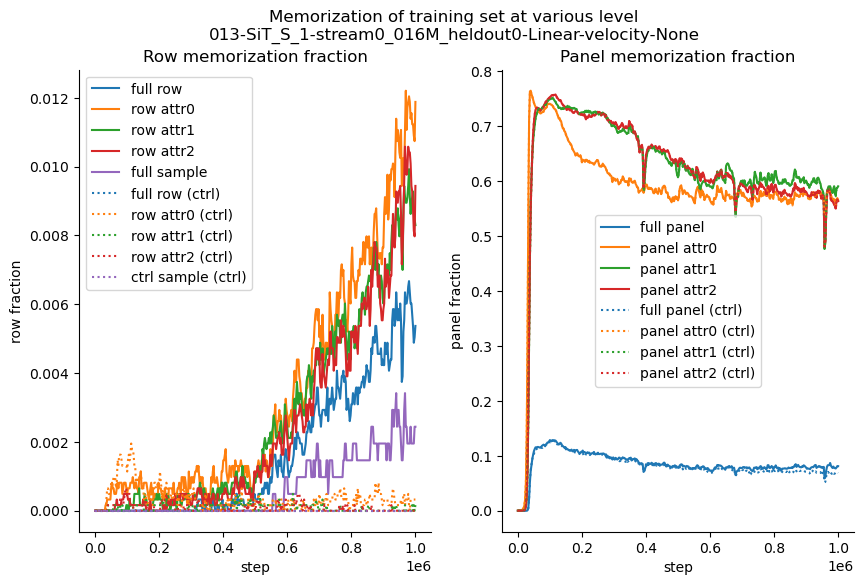

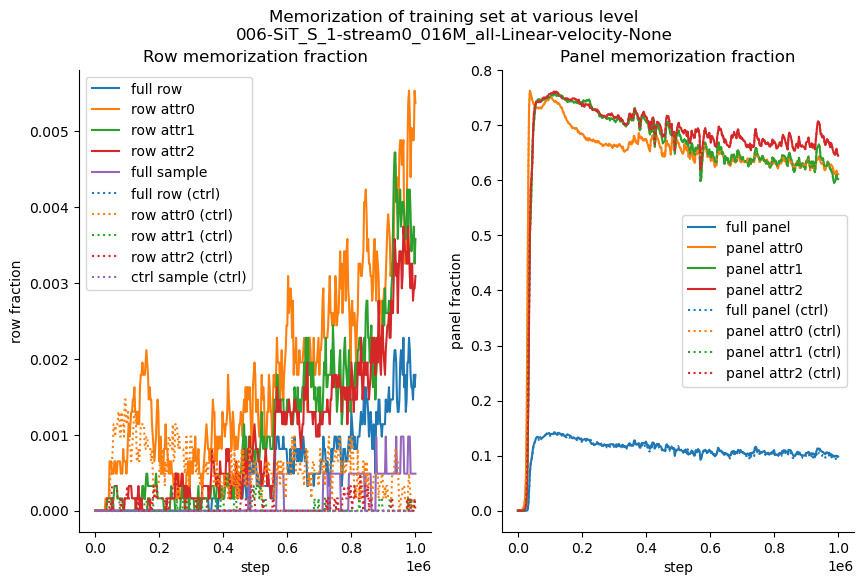

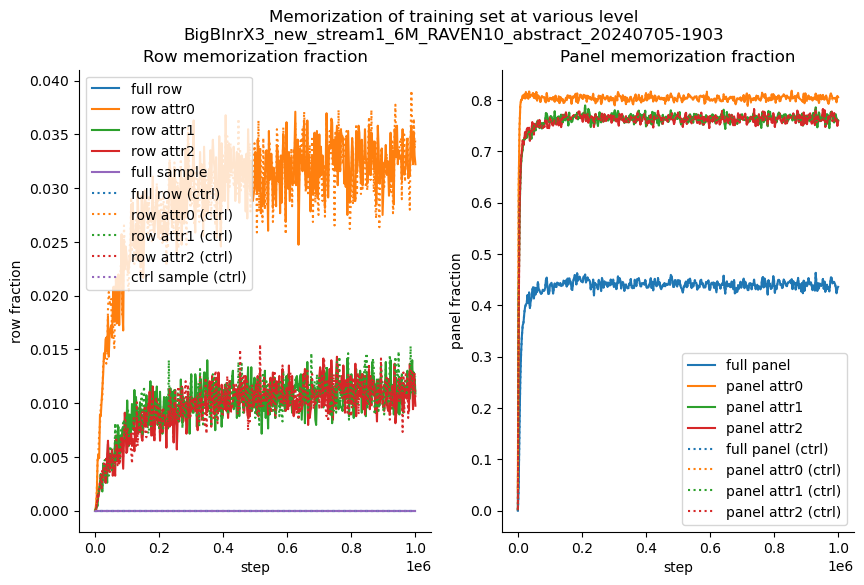

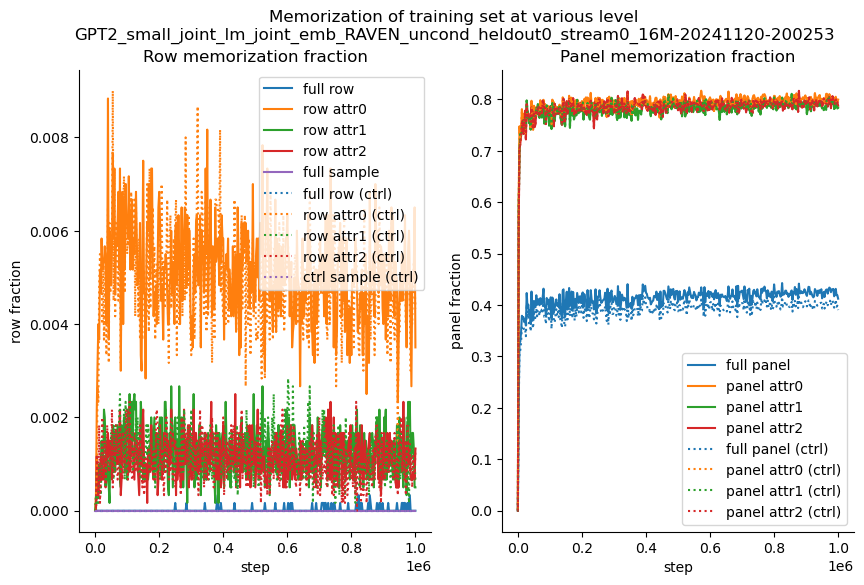

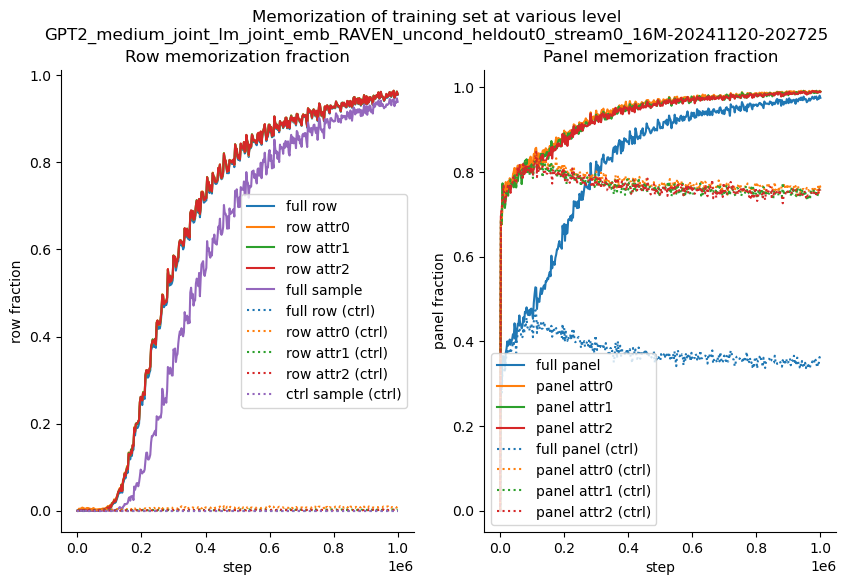

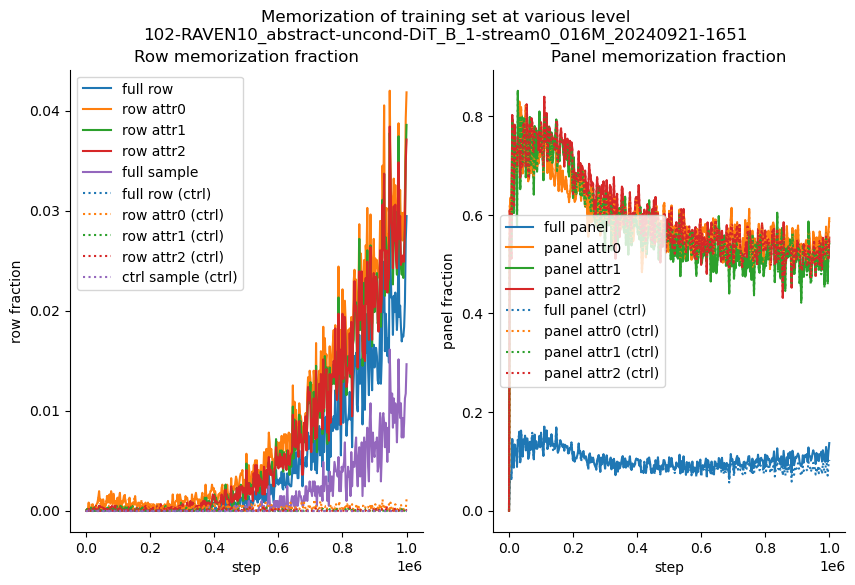

Skipping 087-RAVEN10_abstract-uncond-DiT_S_1-stream16M_20240711-0204


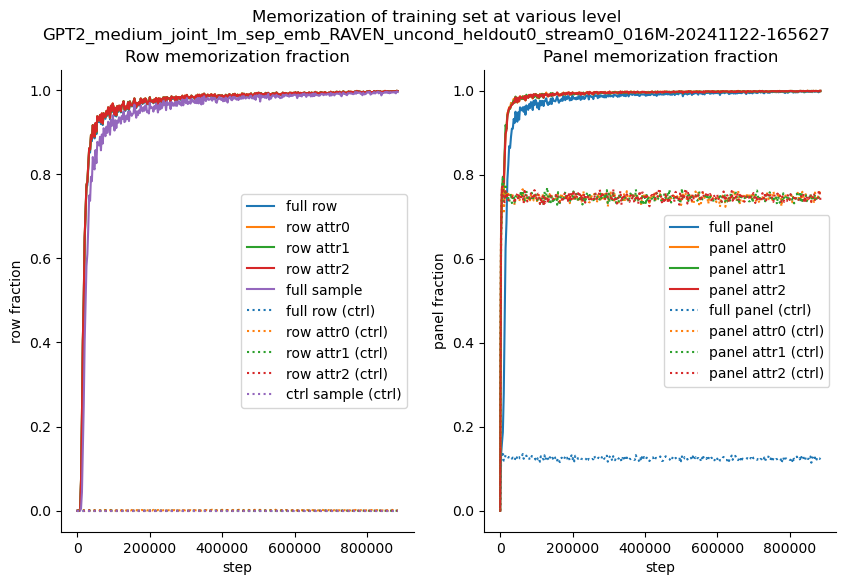

Skipping synopsis


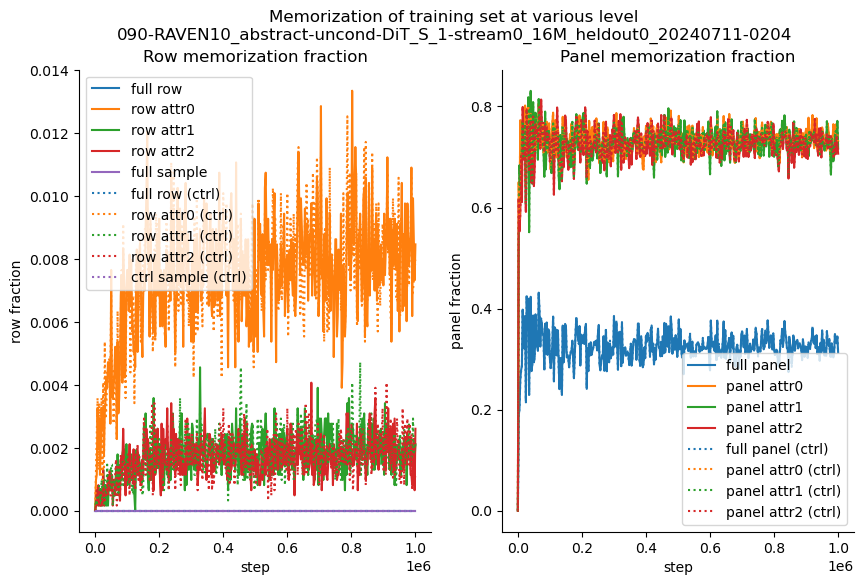

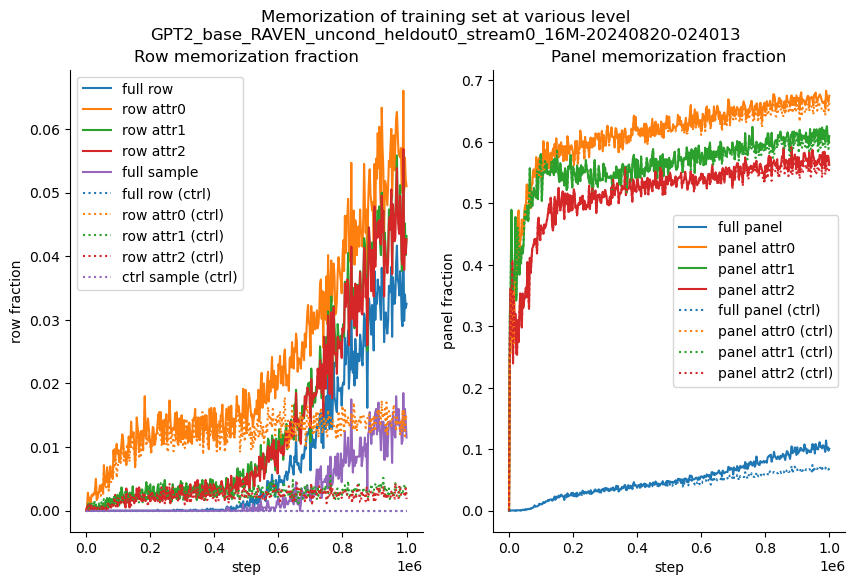

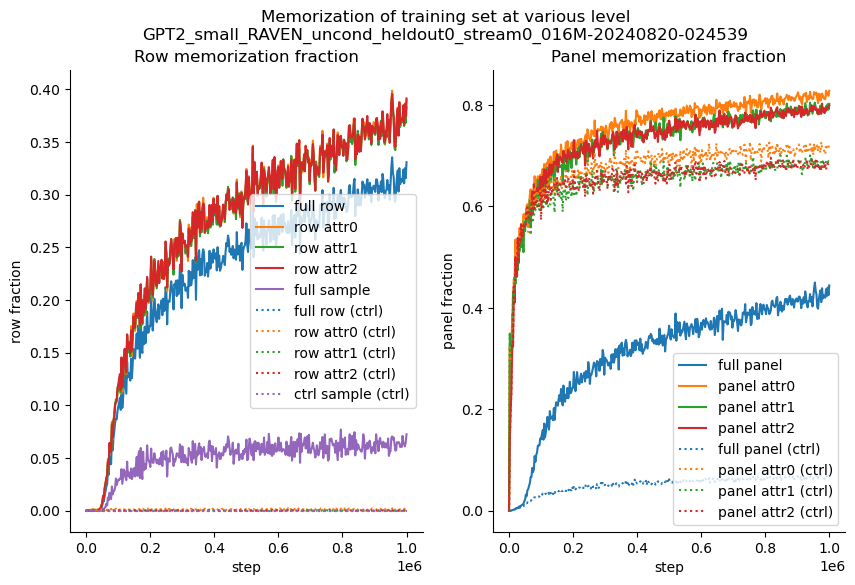

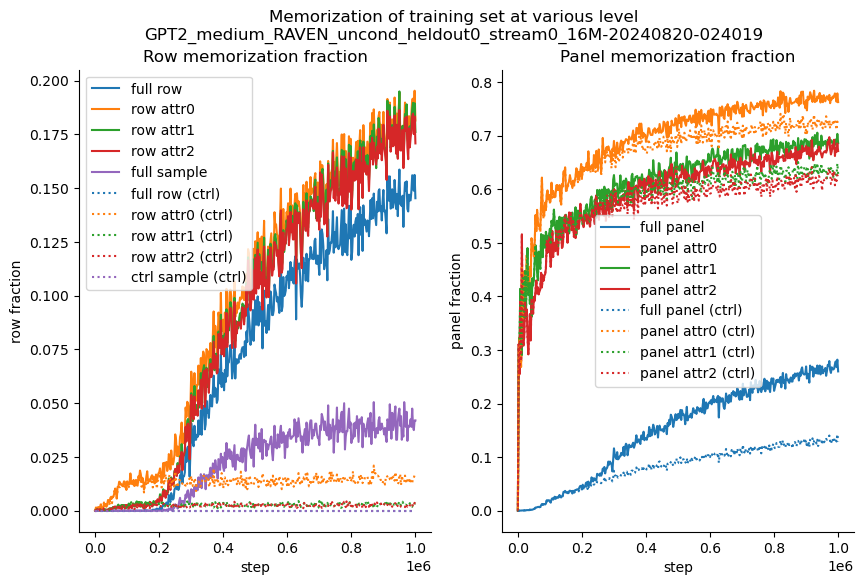

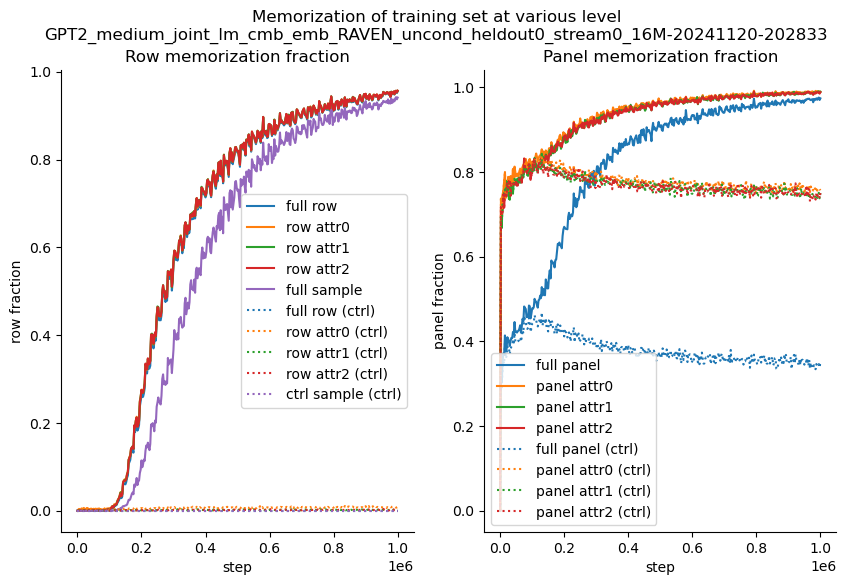

...

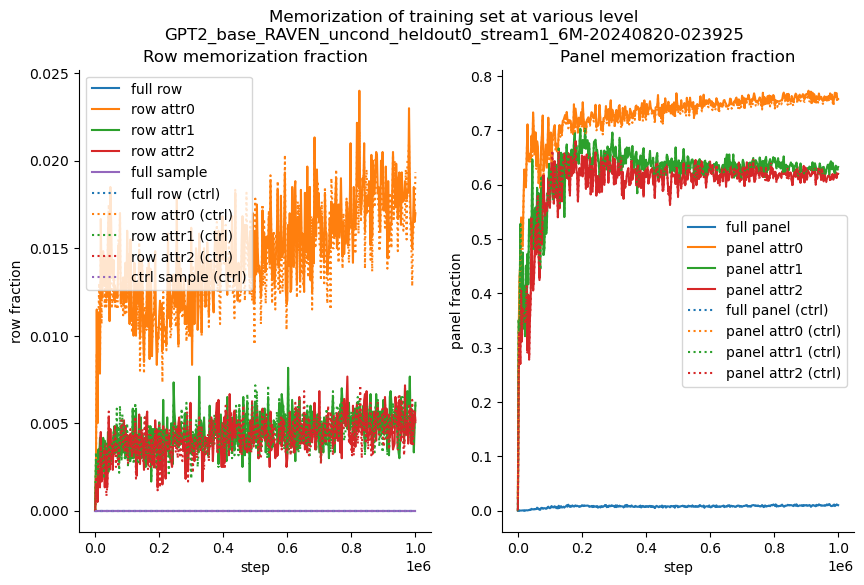

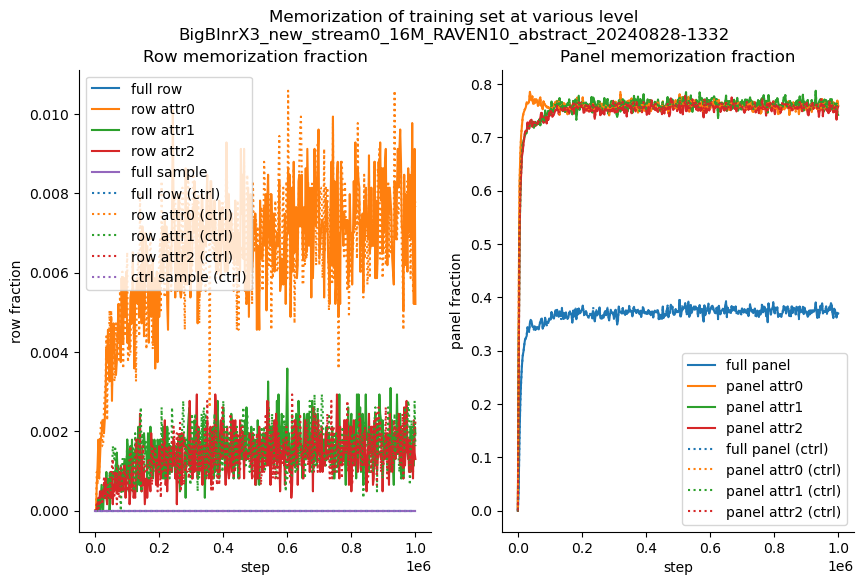

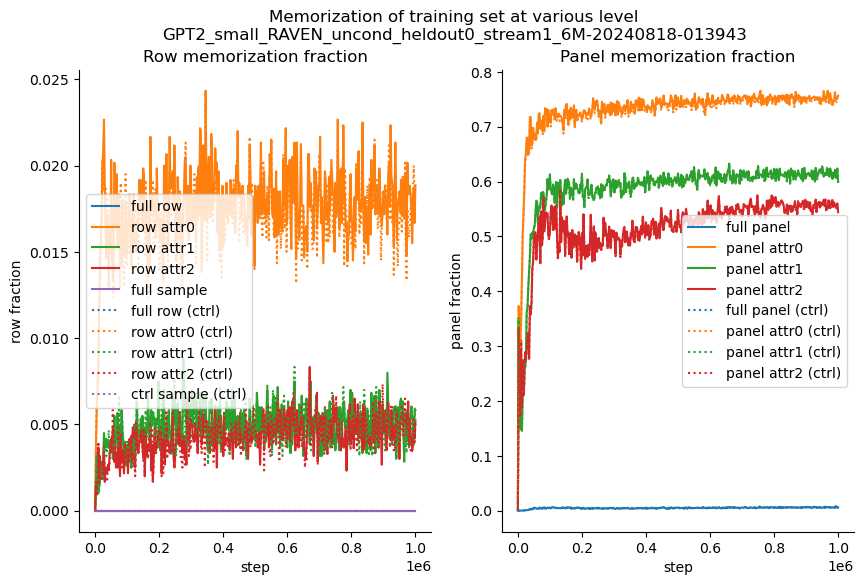

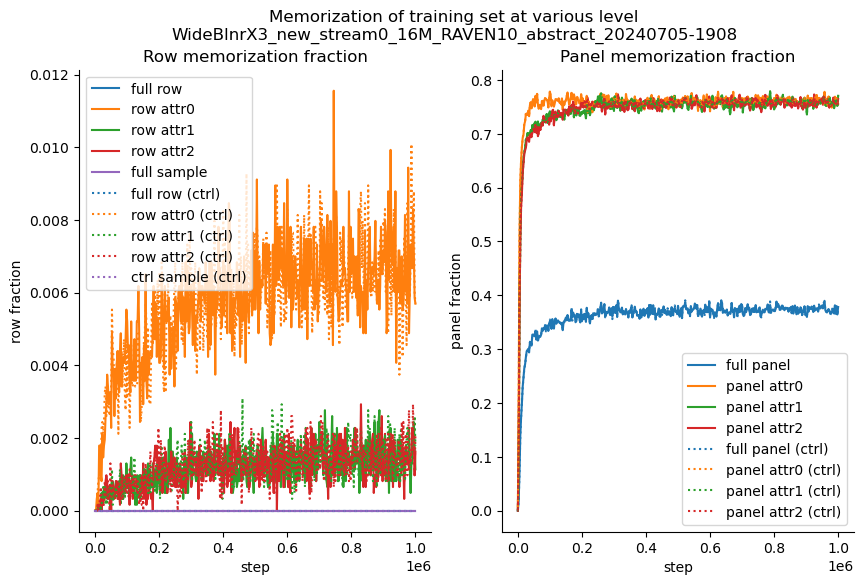

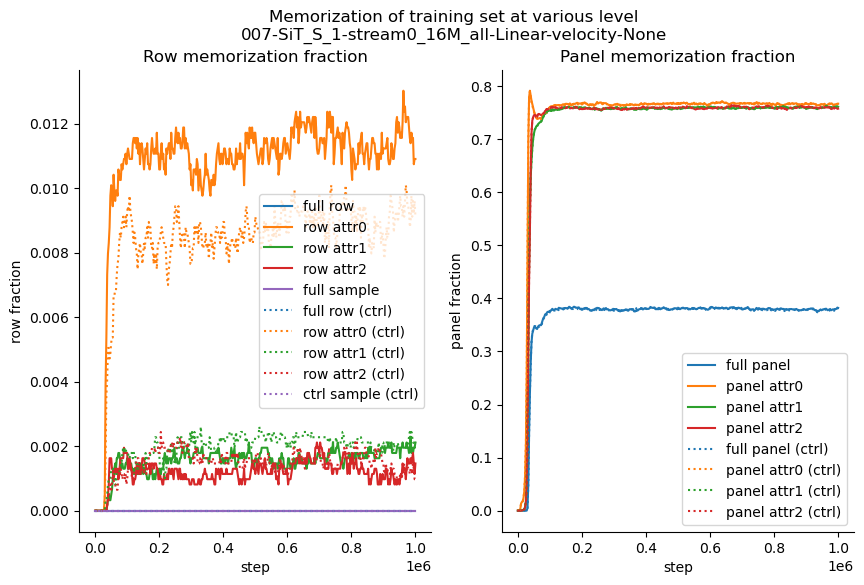

Skipping GPT2_small_RAVEN_uncond_heldout0_stream1_6M-20240820-024123


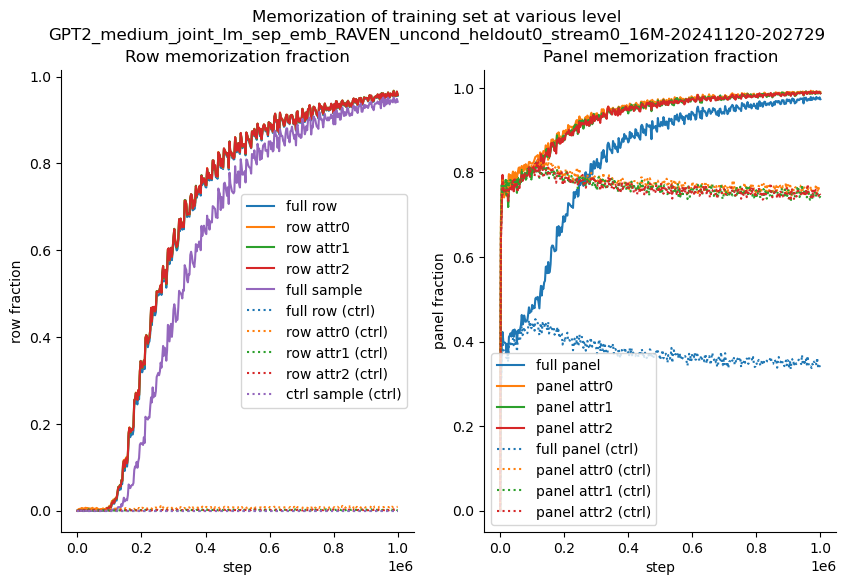

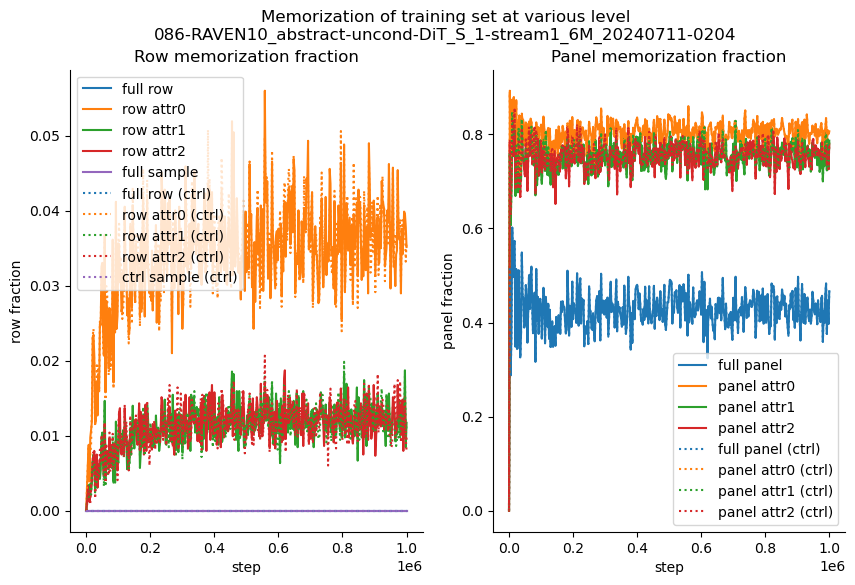

Skipping GPT2_base_RAVEN_uncond_heldout0_stream16M-20240820-024031


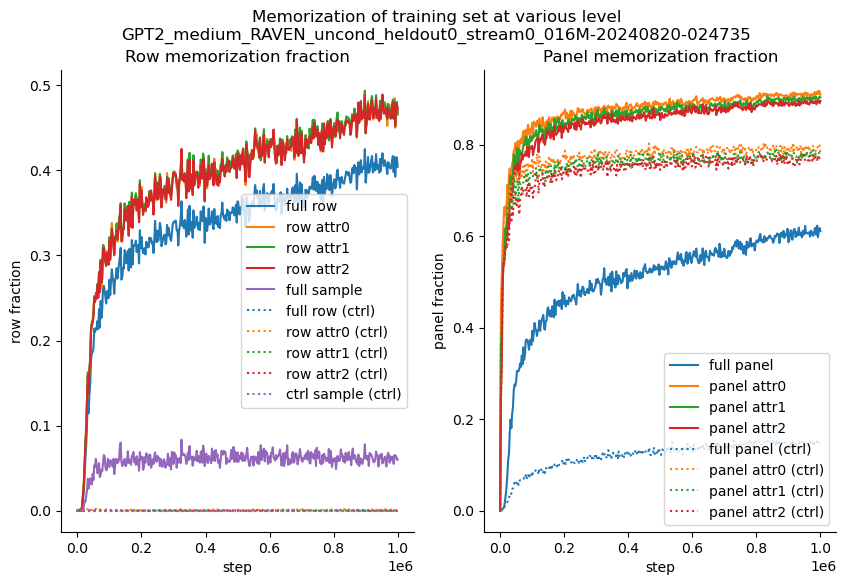

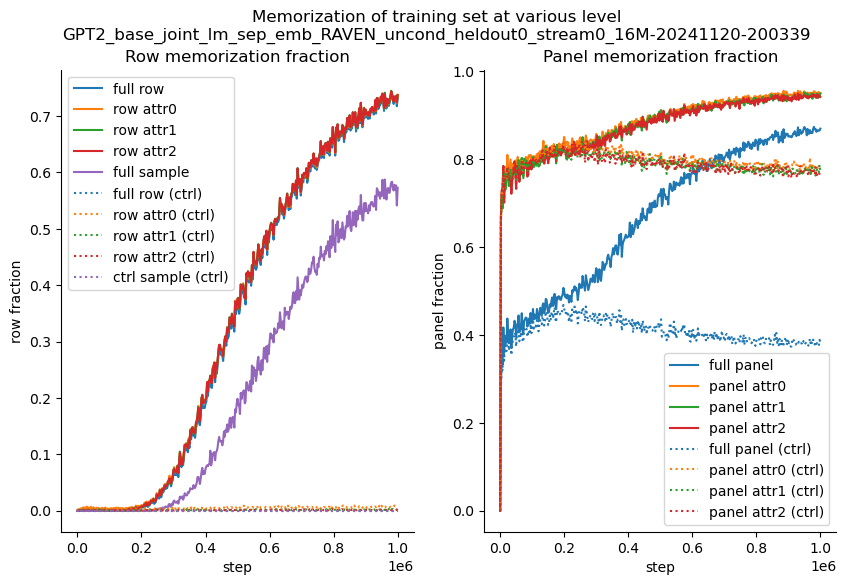

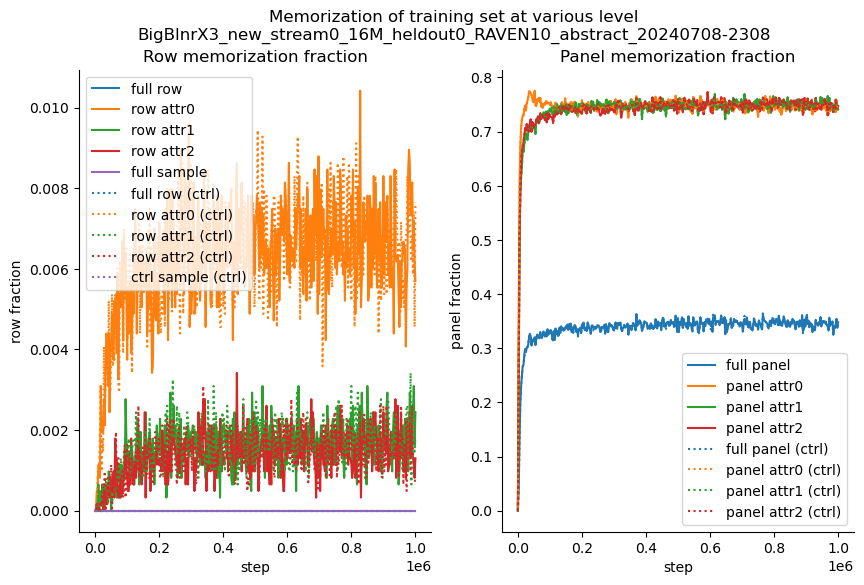

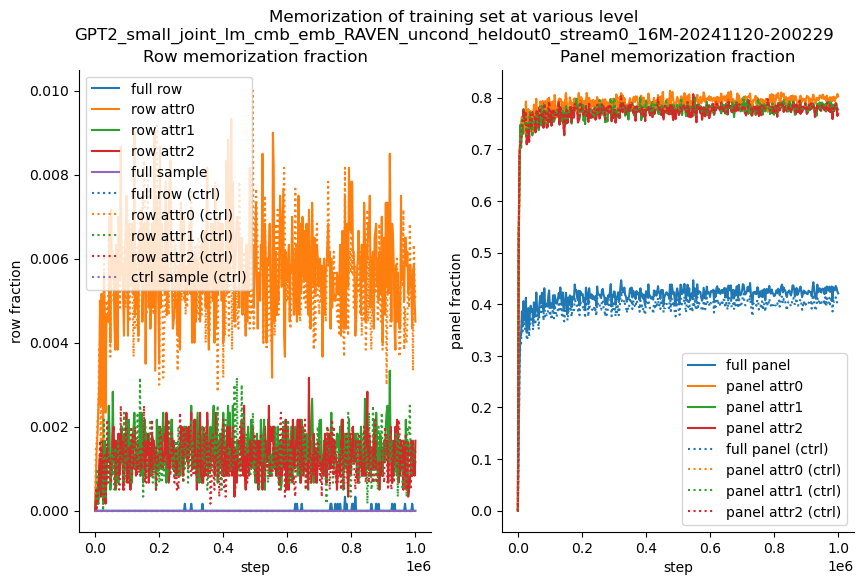

Skipping GPT2_medium_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream16M-20241122-165705


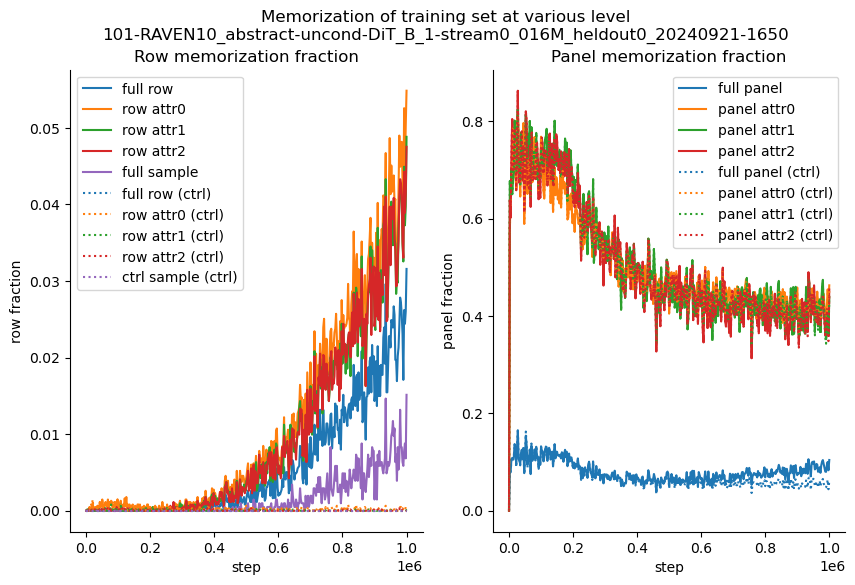

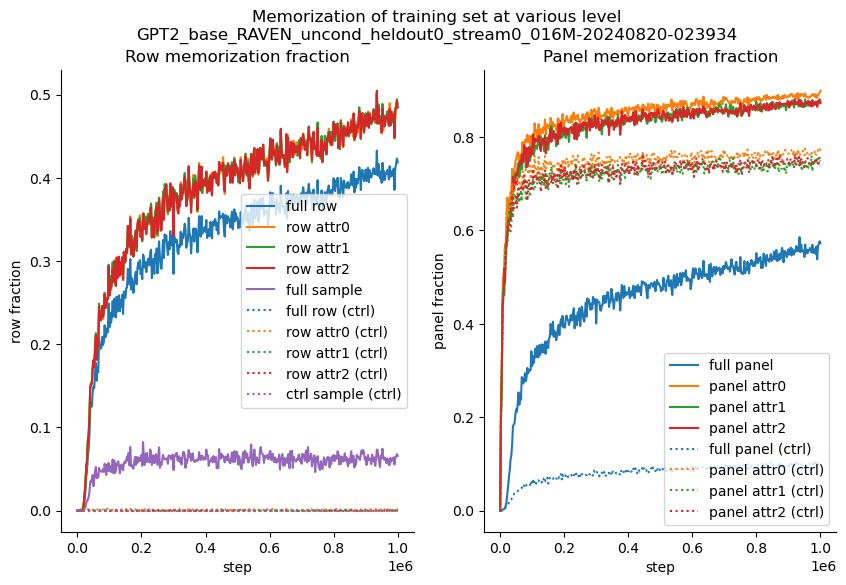

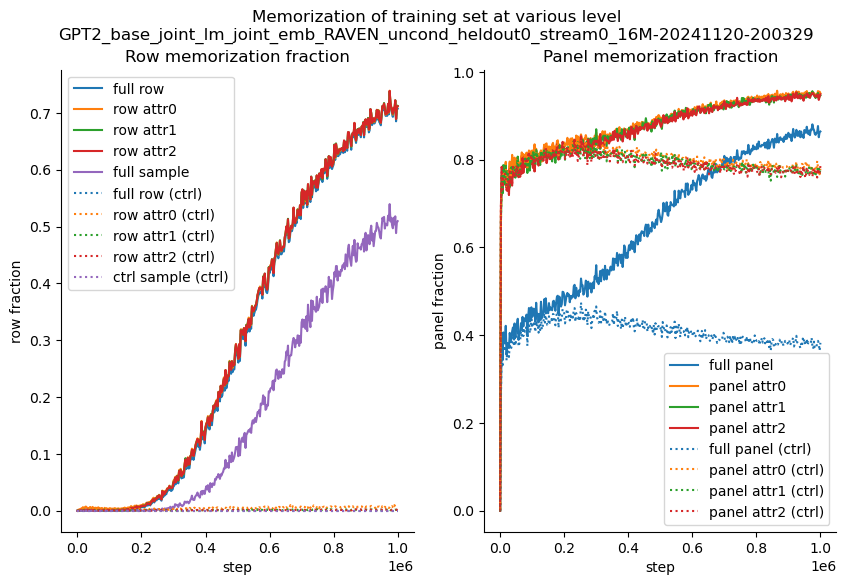

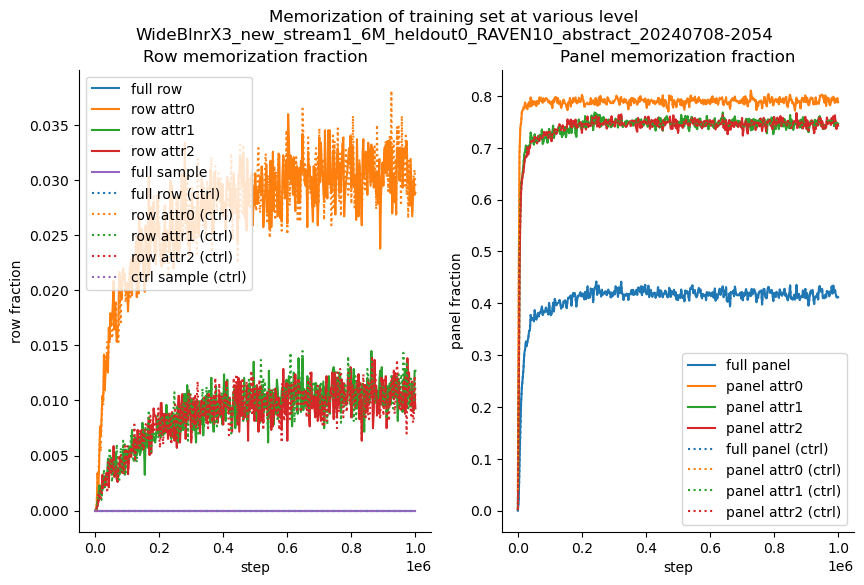

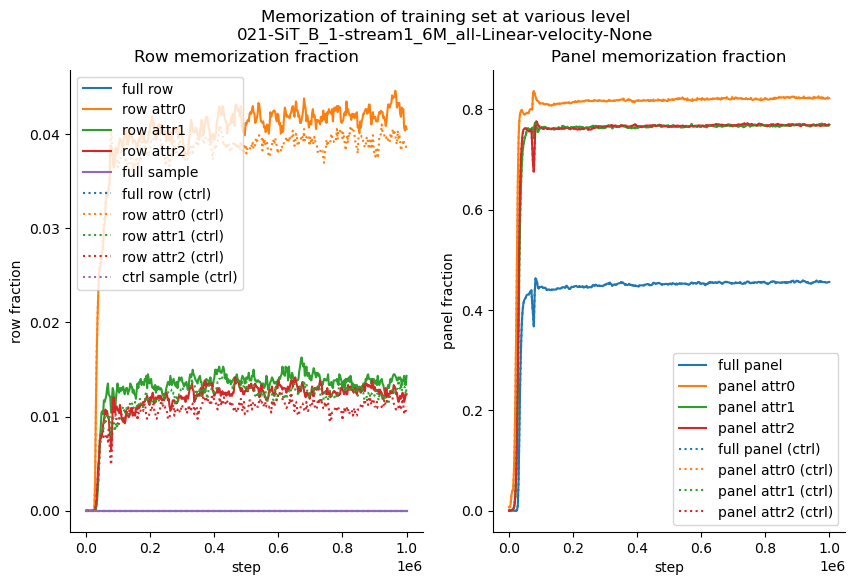

...

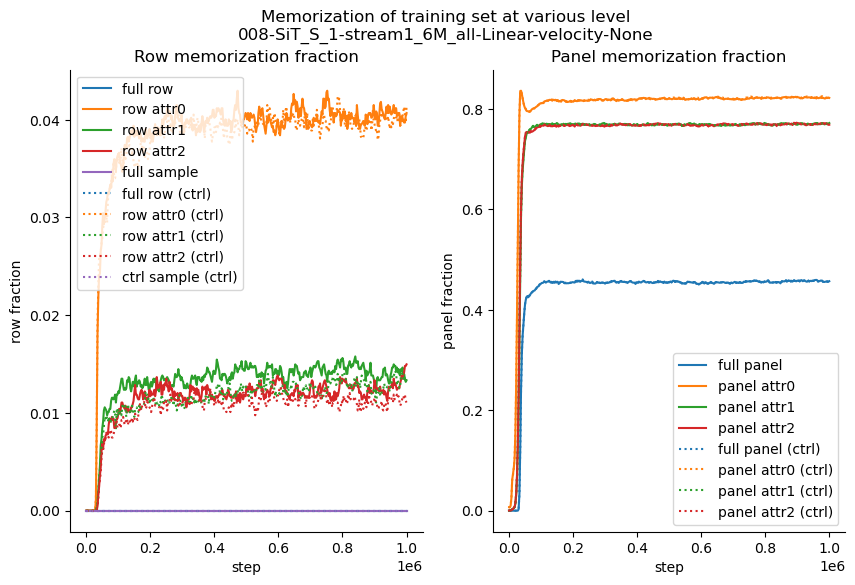

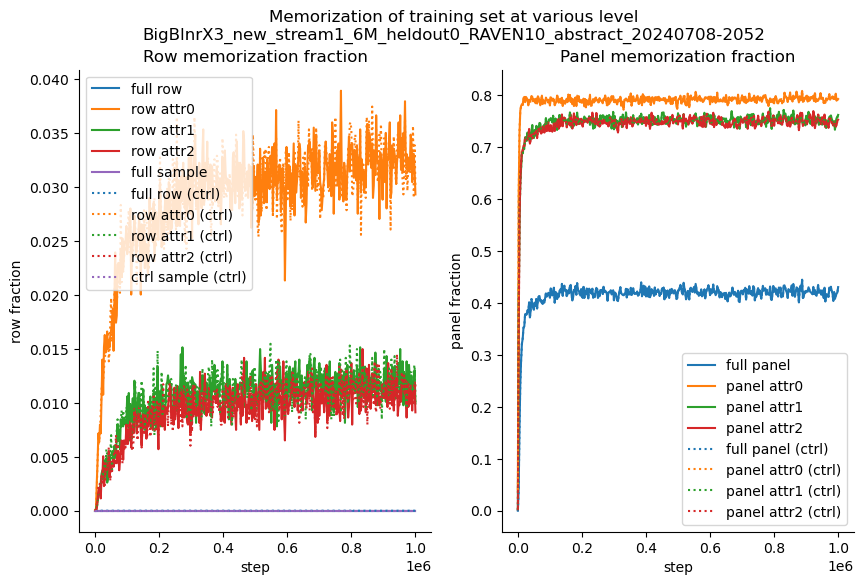

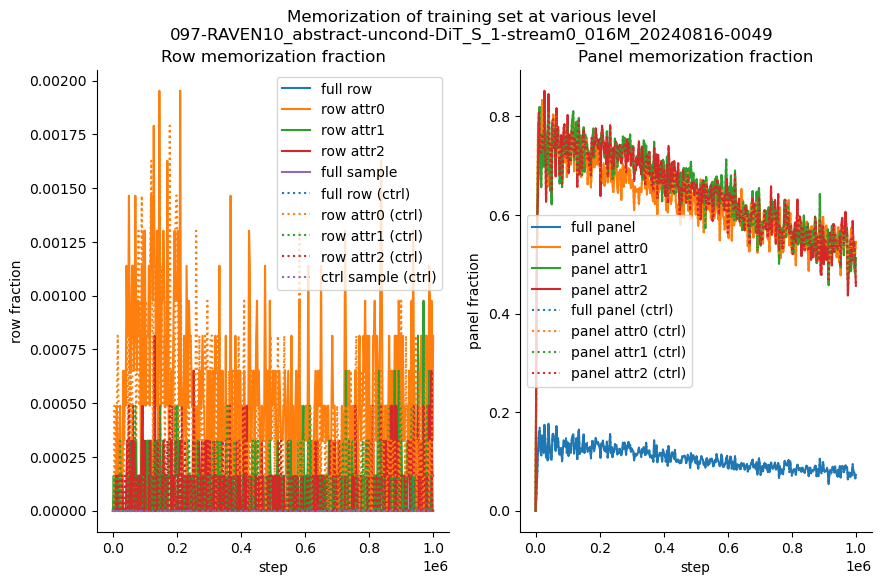

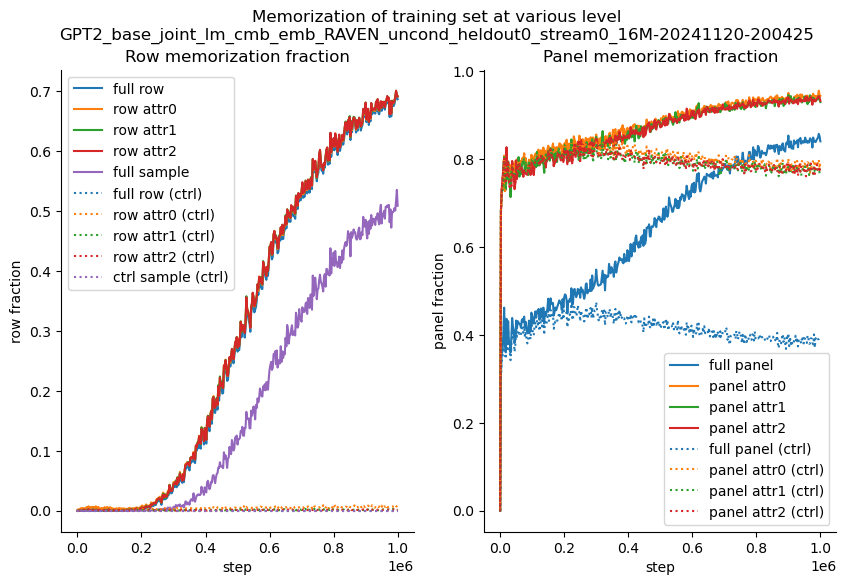

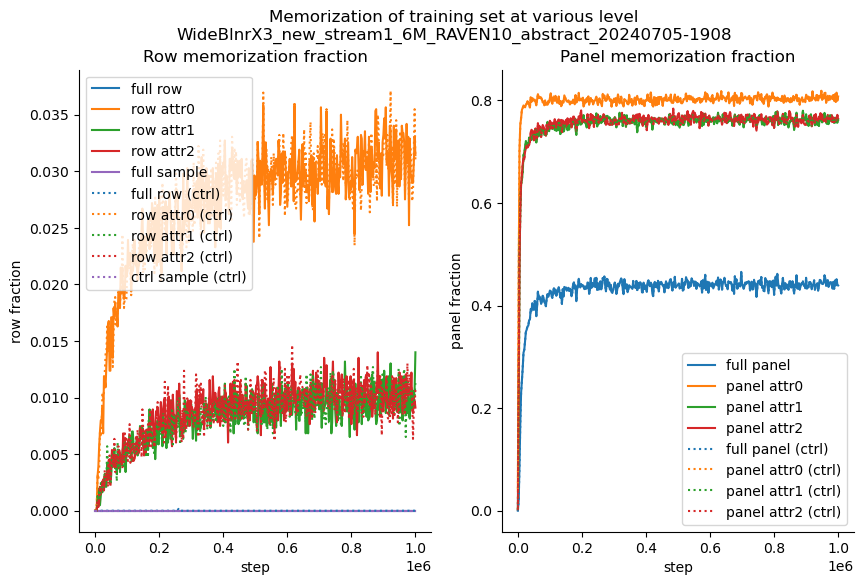

Skipping GPT2_base_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream16M-20241121-002522


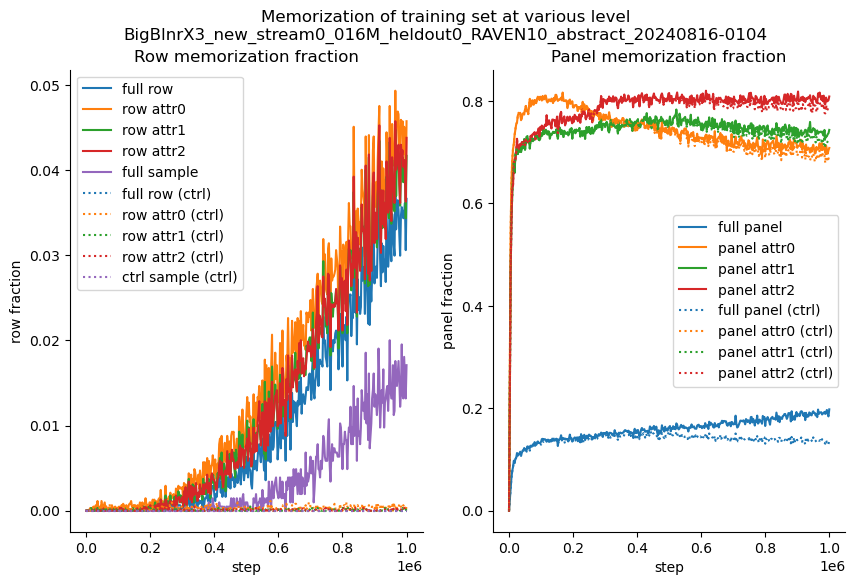

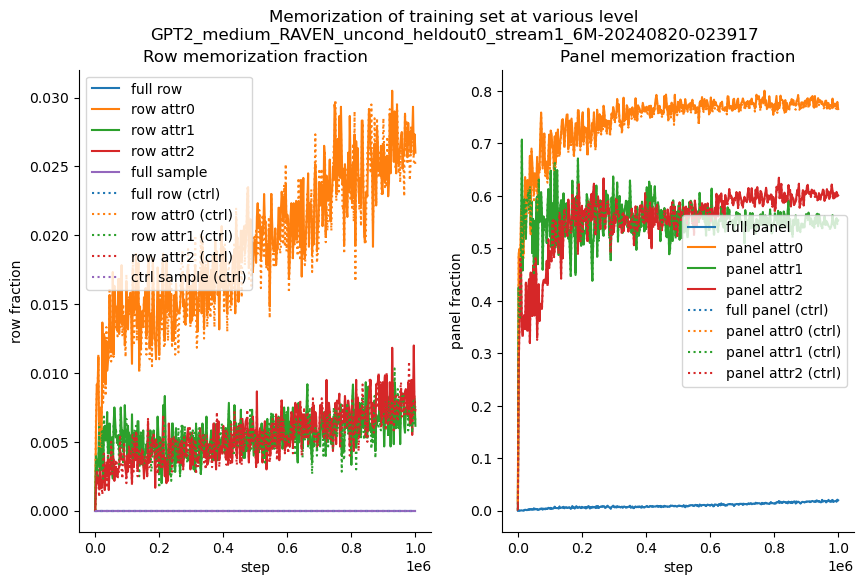

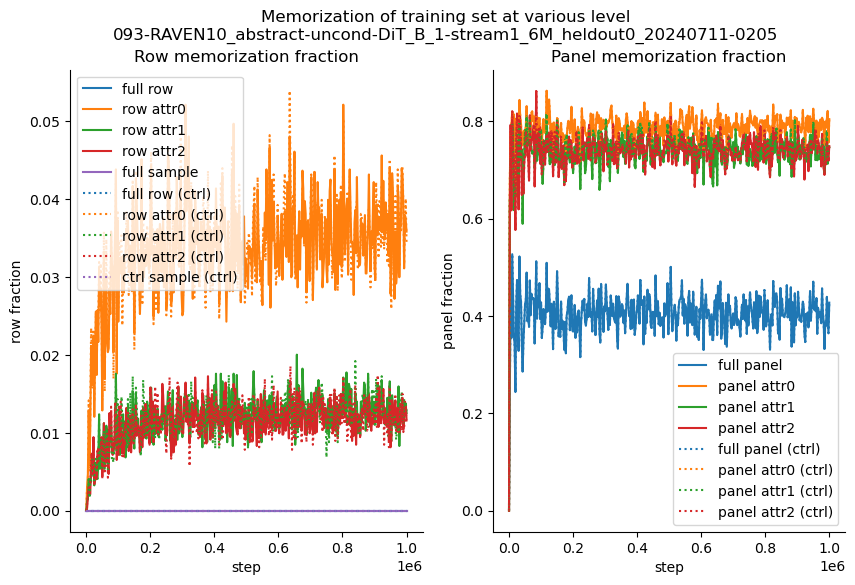

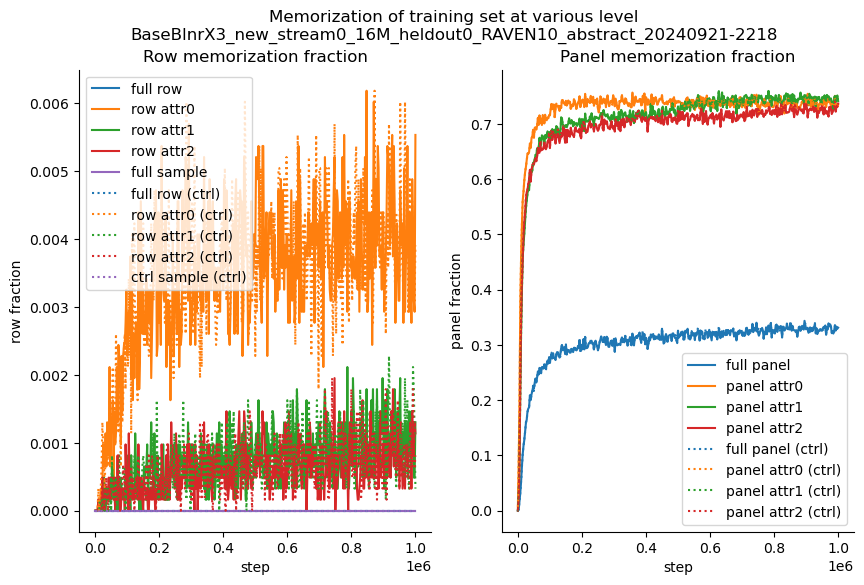

Skipping 088-RAVEN10_abstract-uncond-DiT_S_1-stream16M_heldout0_20240711-0204


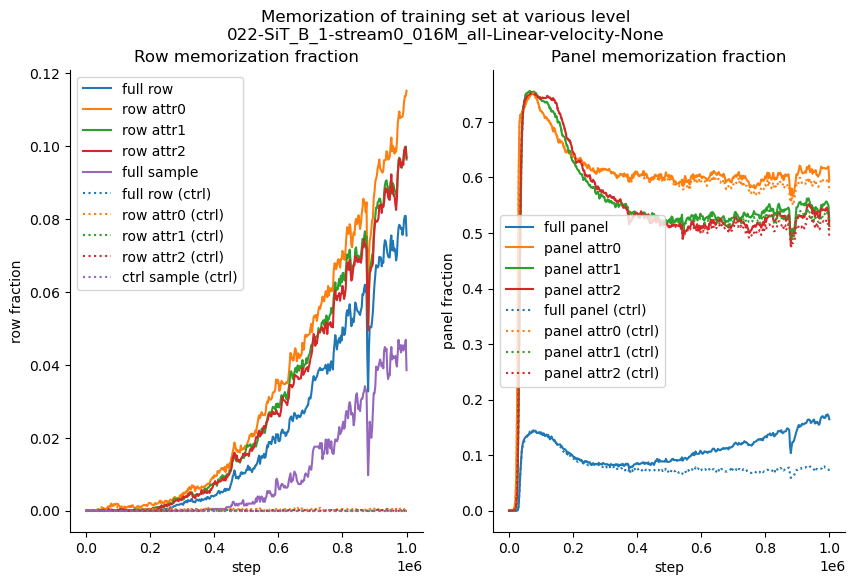

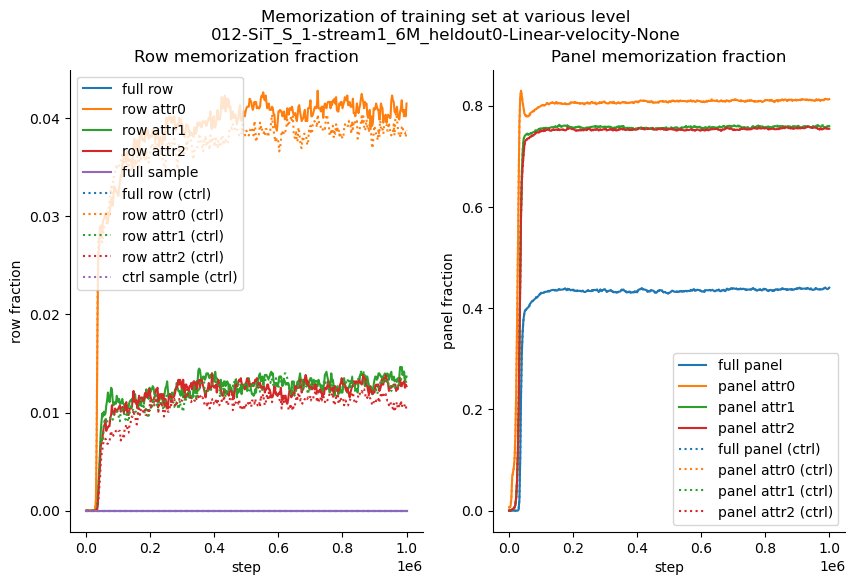

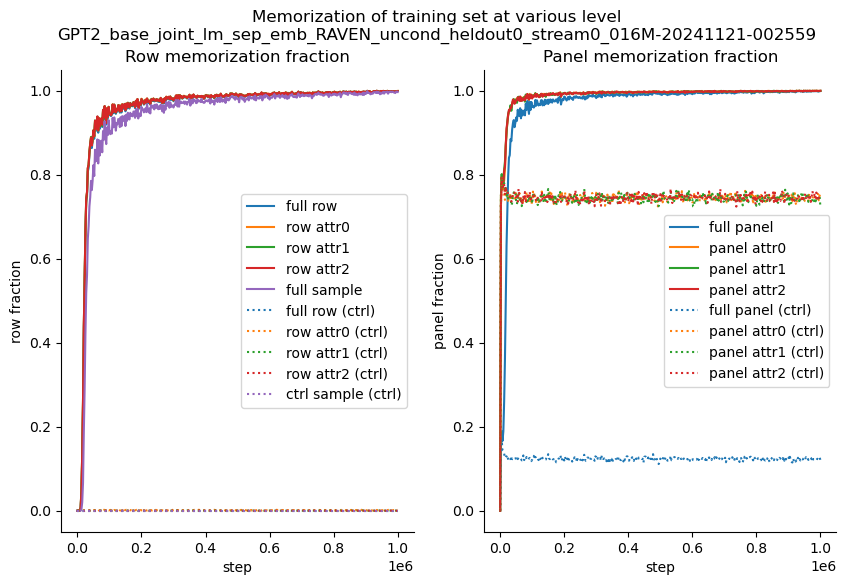

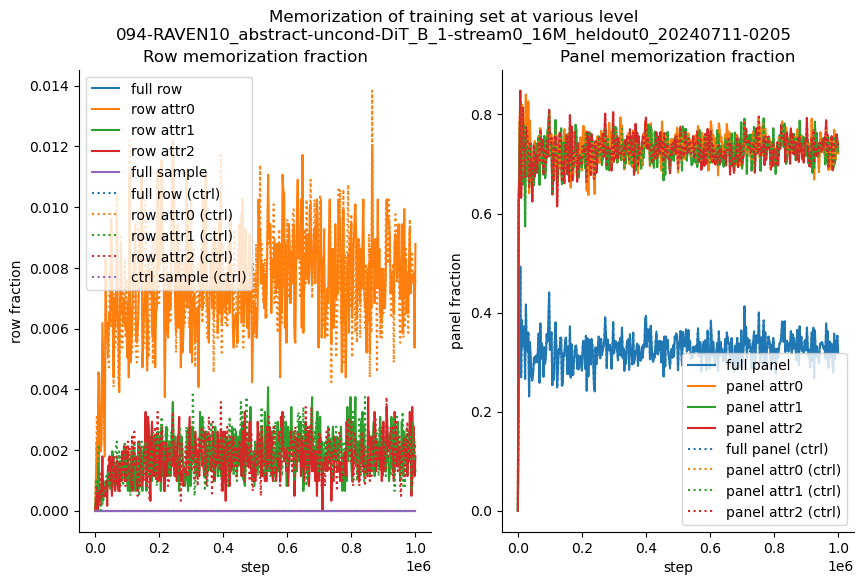

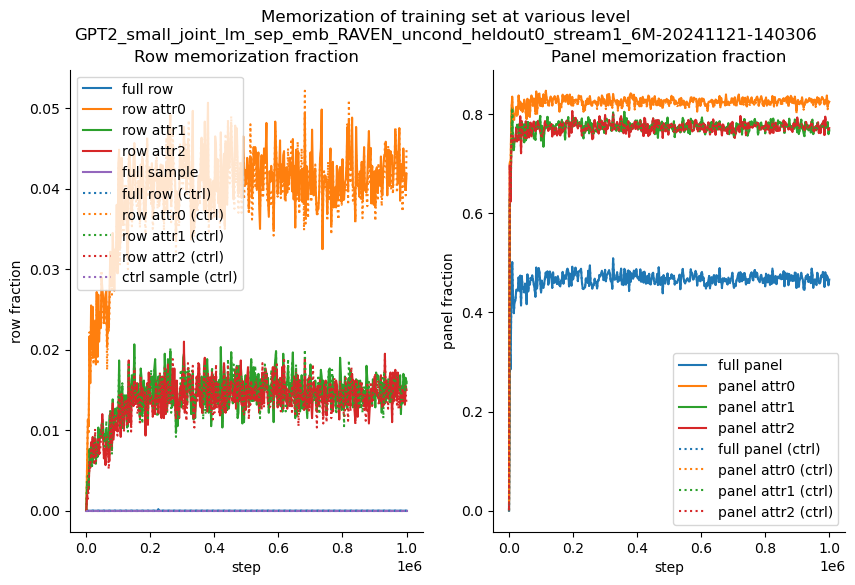

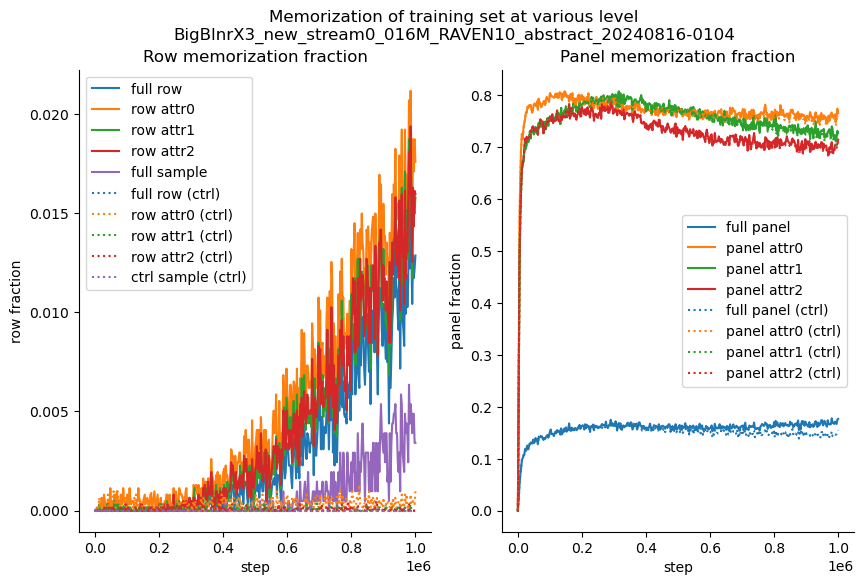

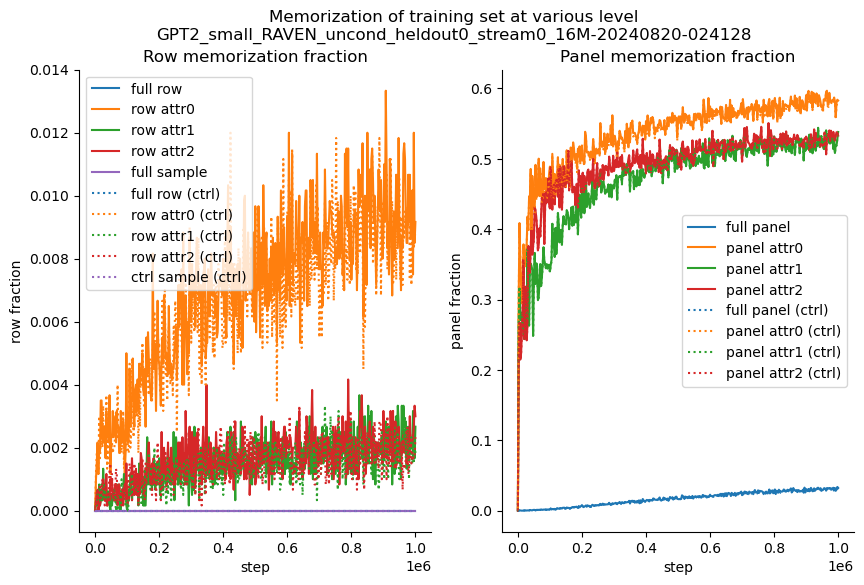

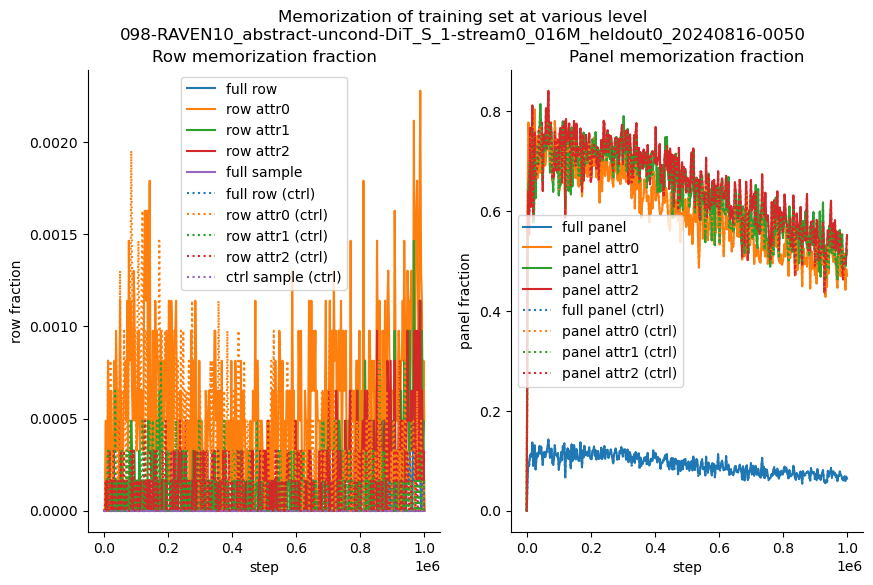

In [6]:
# Define the root directory
# Iterate through all subdirectories and files
for figexpdir, _, files in os.walk(GPTmemroot):
    # Get the experiment name
    expname = os.path.basename(figexpdir)
    try:
        mem_stats_df = pd.read_csv(join(figexpdir, "memorization_stats_train_set.csv"))
        mem_stats_ctrl_df = pd.read_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"), index_col=0)
    except (FileNotFoundError, FileExistsError):
        print(f"Skipping {expname}")
        continue
    figh = visualize_memorization_with_ctrl_dynamics(mem_stats_df, mem_stats_ctrl_df, expname=expname)
    saveallforms(figexpdir, "memorization_dynamics_train_set_ctrl_set", figh)
    plt.close("all")

### Statistics synopsis for GPT

In [7]:
# Define the root directory
# Iterate through all subdirectories and files
mem_syn_col = {}
for figexpdir, _, files in os.walk(GPTmemroot):
    # Get the experiment name
    expname = os.path.basename(figexpdir)
    if os.path.exists(join(figexpdir, "memorization_stats_train_set.csv")):
        mem_stats_df = pd.read_csv(join(figexpdir, "memorization_stats_train_set.csv"), index_col=0)
        last_epoch_stats = mem_stats_df.iloc[-10:].mean()
        mem_syn_col[expname] = last_epoch_stats
    if os.path.exists(join(figexpdir, "memorization_stats_ctrl_set.csv")):
        mem_stats_df_ctrl = pd.read_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"), index_col=0)
        last_epoch_stats_ctrl = mem_stats_df_ctrl.iloc[-10:].mean()
        # mem_syn_col[expname] = last_epoch_stats_ctrl
    
mem_syn_df = pd.DataFrame(mem_syn_col).T

In [8]:
# show columns containing the word "frac" index containing "GPT2"
mem_syn_df.query("index.str.contains('GPT2')").loc[:, mem_syn_df.columns.str.contains('frac')]

,mem_samplefrac,mem_rowfrac,mem_panfrac,mem_attr0_rowfrac,mem_attr0_panfrac,mem_attr1_rowfrac,mem_attr1_panfrac,mem_attr2_rowfrac,mem_attr2_panfrac
GPT2_small_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-200321,0.00000,0.000017,0.423956,0.006267,0.792344,0.001433,0.782639,0.001500,0.779911
GPT2_small_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_016M-20241121-140338,0.98280,0.990567,0.994044,0.991817,0.998156,0.991550,0.997928,0.991450,0.997822
GPT2_small_joint_lm_joint_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-200253,0.00000,0.000050,0.423622,0.004833,0.799961,0.001450,0.789117,0.000917,0.794444
GPT2_medium_joint_lm_joint_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-202725,0.93935,0.955400,0.974511,0.956800,0.990078,0.956617,0.988272,0.956717,0.988956
GPT2_medium_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_016M-20241122-165627,0.99475,0.996817,0.997933,0.997133,0.999206,0.997150,0.999217,0.997117,0.999261
GPT2_base_RAVEN_uncond_heldout0_stream0_16M-20240820-024013,0.01345,0.033833,0.102767,0.054317,0.667828,0.044267,0.612600,0.043683,0.570911
GPT2_small_RAVEN_uncond_heldout0_stream0_016M-20240820-024539,0.06455,0.318067,0.429328,0.376400,0.819744,0.373383,0.794072,0.376950,0.793172
GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019,0.04085,0.148583,0.268028,0.184383,0.771244,0.180817,0.688056,0.175800,0.675278
GPT2_medium_joint_lm_cmb_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-202833,0.93540,0.950983,0.971167,0.952283,0.988956,0.952350,0.987400,0.952367,0.986222
GPT2_base_RAVEN_uncond_heldout0_stream1_6M-20240820-023925,0.00000,0.000000,0.009761,0.017650,0.761094,0.005483,0.631294,0.004783,0.616072


In [9]:
# show columns containing the word "frac" index containing "GPT2"
mem_syn_df_GPT2 = mem_syn_df.query("index.str.contains('GPT2')")
mem_syn_df_GPT2["dataset_size"] = mem_syn_df_GPT2.index.map(extract_and_convert)
mem_syn_df_GPT2["scale"] = mem_syn_df_GPT2.index.map(\
    lambda x: "GPT2x1" if "GPT2_small" in x else "GPT2x2" if "GPT2_base" in x else "GPT2x3" if "GPT2_medium" in x else "None")
mem_syn_df_GPT2["joint_readout"] = mem_syn_df_GPT2.index.map(lambda x: "joint_lm" in x)
mem_syn_df_GPT2["embed_type"] = mem_syn_df_GPT2.index.map(lambda x: "sep" if "sep_emb" in x else "joint" if "joint_emb" in x else "cmb" if "cmb_emb" in x else "default")
joint_str = {True: "joint_lm", False: "sep_lm"}
mem_syn_df_GPT2["readout_embed"] = mem_syn_df_GPT2.apply(lambda row: 
    row.embed_type + "_emb-" + joint_str[row.joint_readout] if row.embed_type != "default" \
        else "sep_emb-" + joint_str[row.joint_readout], axis=1)
mem_syn_df_GPT2

/tmp/ipykernel_682058/2305555493.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mem_syn_df_GPT2["dataset_size"] = mem_syn_df_GPT2.index.map(extract_and_convert)
/tmp/ipykernel_682058/2305555493.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mem_syn_df_GPT2["scale"] = mem_syn_df_GPT2.index.map(\
/tmp/ipykernel_682058/2305555493.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in

,epoch,C3,C2,valid,total,mem_samplecnt,mem_samplefrac,mem_rowcnt,mem_rowfrac,mem_pancnt,...,mem_attr1_panfrac,mem_attr2_rowcnt,mem_attr2_rowfrac,mem_attr2_pancnt,mem_attr2_panfrac,dataset_size,scale,joint_readout,embed_type,readout_embed
GPT2_small_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-200321,988749.0,820.4,245.8,3722.4,2000.0,0.0,0.00000,0.1,0.000017,7631.2,...,0.782639,9.0,0.001500,14038.4,0.779911,0.160,GPT2x1,True,sep,sep_emb-joint_lm
GPT2_small_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_016M-20241121-140338,988749.0,1982.4,7.2,5977.6,2000.0,1965.6,0.98280,5943.4,0.990567,17892.8,...,0.997928,5948.7,0.991450,17960.8,0.997822,0.016,GPT2x1,True,sep,sep_emb-joint_lm
GPT2_small_joint_lm_joint_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-200253,988749.0,626.6,296.3,3611.0,2000.0,0.0,0.00000,0.3,0.000050,7625.2,...,0.789117,5.5,0.000917,14300.0,0.794444,0.160,GPT2x1,True,joint,joint_emb-joint_lm
GPT2_medium_joint_lm_joint_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-202725,988749.0,1938.2,14.3,5891.5,2000.0,1878.7,0.93935,5732.4,0.955400,17541.2,...,0.988272,5740.3,0.956717,17801.2,0.988956,0.160,GPT2x3,True,joint,joint_emb-joint_lm
GPT2_medium_joint_lm_sep_emb_RAVEN_uncond_heldout0_stream0_016M-20241122-165627,873749.0,1994.3,1.8,5992.0,2000.0,1989.5,0.99475,5980.9,0.996817,17962.8,...,0.999217,5982.7,0.997117,17986.7,0.999261,0.016,GPT2x3,True,sep,sep_emb-joint_lm
GPT2_base_RAVEN_uncond_heldout0_stream0_16M-20240820-024013,988749.0,467.1,309.9,3113.9,2000.0,26.9,0.01345,203.0,0.033833,1849.8,...,0.612600,262.1,0.043683,10276.4,0.570911,0.160,GPT2x2,False,default,sep_emb-sep_lm
GPT2_small_RAVEN_uncond_heldout0_stream0_016M-20240820-024539,988749.0,720.4,260.0,4188.1,2000.0,129.1,0.06455,1908.4,0.318067,7727.9,...,0.794072,2261.7,0.376950,14277.1,0.793172,0.016,GPT2x1,False,default,sep_emb-sep_lm
GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019,988749.0,690.2,381.8,3743.3,2000.0,81.7,0.04085,891.5,0.148583,4824.5,...,0.688056,1054.8,0.175800,12155.0,0.675278,0.160,GPT2x3,False,default,sep_emb-sep_lm
GPT2_medium_joint_lm_cmb_emb_RAVEN_uncond_heldout0_stream0_16M-20241120-202833,988749.0,1932.9,13.7,5878.5,2000.0,1870.8,0.93540,5705.9,0.950983,17481.0,...,0.987400,5714.2,0.952367,17752.0,0.986222,0.160,GPT2x3,True,cmb,cmb_emb-joint_lm
GPT2_base_RAVEN_uncond_heldout0_stream1_6M-20240820-023925,988749.0,205.5,457.7,2657.5,2000.0,0.0,0.00000,0.0,0.000000,175.7,...,0.631294,28.7,0.004783,11089.3,0.616072,1.600,GPT2x2,False,default,sep_emb-sep_lm


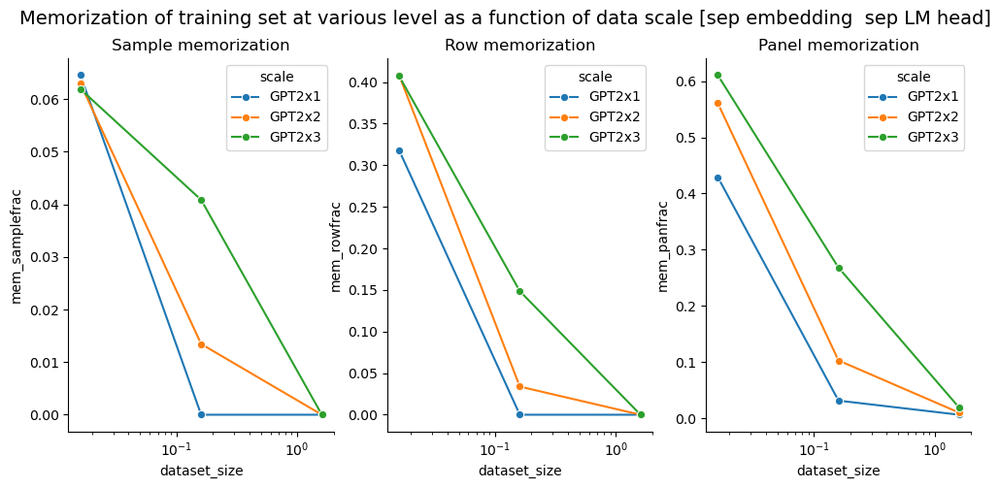

In [10]:
figh, axs = plt.subplots(1, 3, figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac'],
                           ["Sample memorization", "Row memorization", "Panel memorization"]):
    sns.lineplot(data=mem_syn_df_GPT2.query("readout_embed == 'sep_emb-sep_lm'"), x="dataset_size", y=frac, hue="scale", 
                 markers=True, dashes=False, ax=ax, marker="o",
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
plt.suptitle("Memorization of training set at various level as a function of data scale [sep embedding  sep LM head]", fontsize=14)
saveallforms(memsyndir, "GPT2_memorization_scaling_curve_orig_sep_lm", figh)
plt.show()

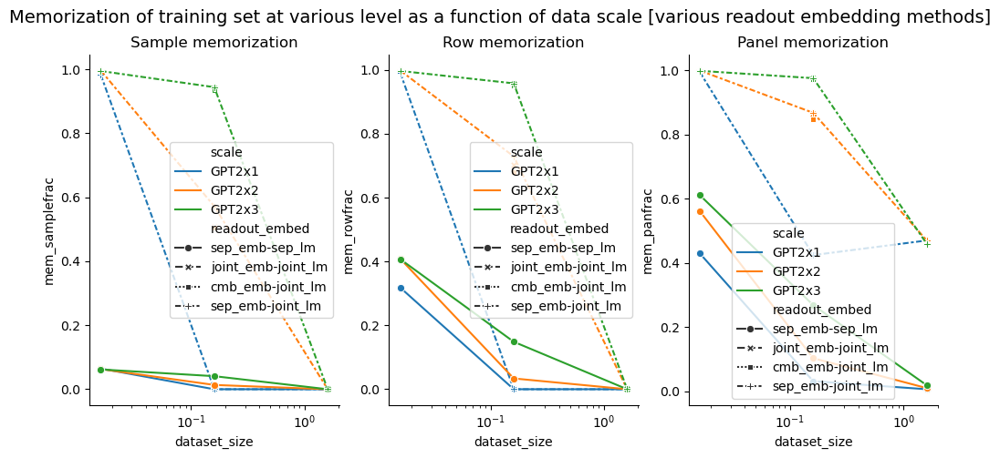

In [11]:
figh, axs = plt.subplots(1, 3, figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac'],
                           ["Sample memorization", "Row memorization", "Panel memorization"]):
    sns.lineplot(data=mem_syn_df_GPT2, x="dataset_size", y=frac, hue="scale", style="readout_embed",
                 ax=ax, markers=True,# dashes=False, marker="o",
                 style_order=["sep_emb-sep_lm", "joint_emb-joint_lm", "cmb_emb-joint_lm", "sep_emb-joint_lm",],
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
plt.suptitle("Memorization of training set at various level as a function of data scale [various readout embedding methods]", fontsize=14)
saveallforms(memsyndir, "GPT2_memorization_scaling_curve_new_readout_embed_method", figh)
plt.show()

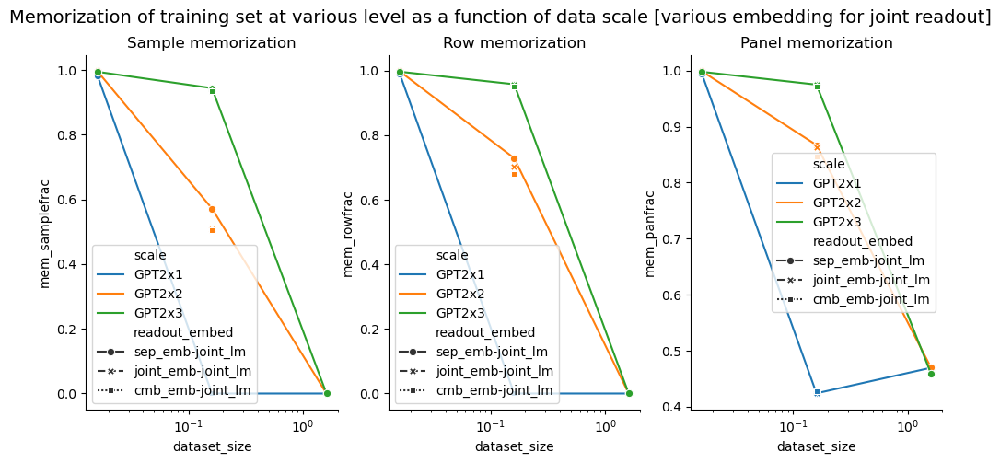

In [12]:
figh, axs = plt.subplots(1, 3, figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac'],
                           ["Sample memorization", "Row memorization", "Panel memorization"]):
    sns.lineplot(data=mem_syn_df_GPT2.query("readout_embed != 'sep_emb-sep_lm'"), x="dataset_size", y=frac, hue="scale", style="readout_embed",
                 markers=True, ax=ax, #dashes=False, marker="o",
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
plt.suptitle("Memorization of training set at various level as a function of data scale [various embedding for joint readout]", fontsize=14)
saveallforms(memsyndir, "GPT2_memorization_scaling_curve_new_joint_readout_method", figh)
plt.show()

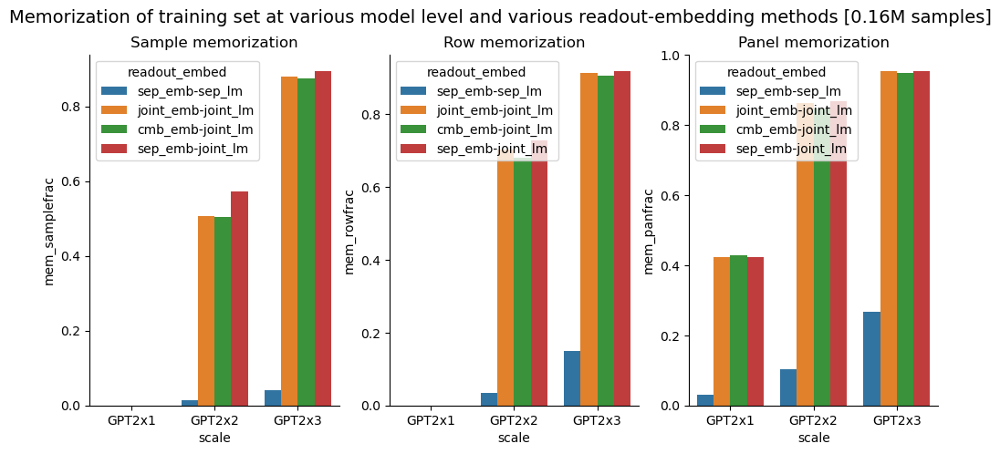

In [42]:
figh, axs = plt.subplots(1, 3, figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac'],
                           ["Sample memorization", "Row memorization", "Panel memorization"]):
    sns.barplot(data=mem_syn_df_GPT2.query("dataset_size == 0.16"), x="scale", y=frac, hue="readout_embed", #style="readout_embed",
                ax=ax, order=["GPT2x1", "GPT2x2", "GPT2x3"],
                hue_order=["sep_emb-sep_lm", "joint_emb-joint_lm", "cmb_emb-joint_lm", "sep_emb-joint_lm",],)# markers=True, dashes=False, marker="o",
    ax.set_title(title)
plt.suptitle("Memorization of training set at various model level and various readout-embedding methods [0.16M samples]", fontsize=14)
saveallforms(memsyndir, "GPT2_memorization_scaling_curve_new_readout_embed_method_bar", figh)
plt.show()

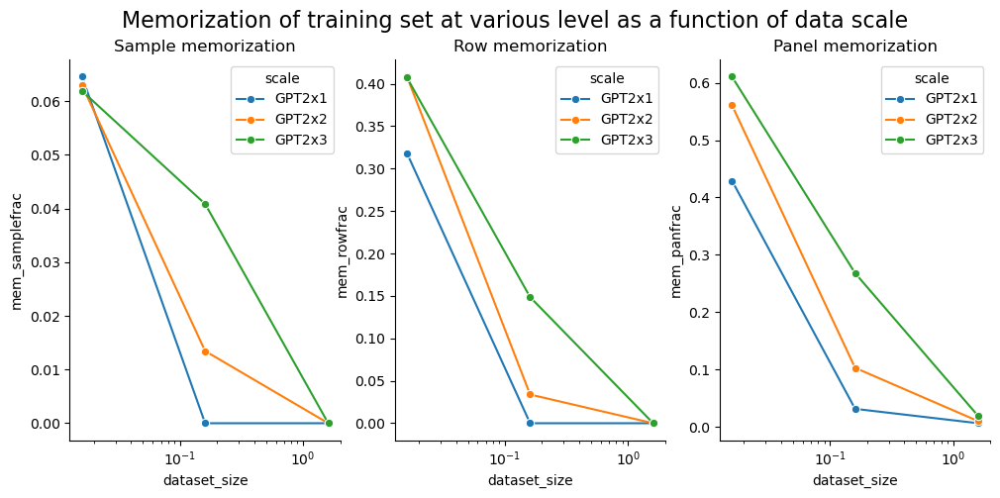

In [35]:
figh, axs = plt.subplots(1, 3, figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac'],
                           ["Sample memorization", "Row memorization", "Panel memorization"]):
    sns.lineplot(data=mem_syn_df_GPT2, x="dataset_size", y=frac, hue="scale", 
                 markers=True, dashes=False, ax=ax, marker="o",
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
plt.suptitle("Memorization of training set at various level as a function of data scale", fontsize=16)
saveallforms(memsyndir, "GPT2_memorization_scaling_curve", figh)
plt.show()

In [34]:
mem_syn_df.loc["GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019", mem_syn_df.columns.str.contains('frac')]

mem_samplefrac       0.040850
mem_rowfrac          0.148583
mem_panfrac          0.268028
mem_attr0_rowfrac    0.184383
mem_attr0_panfrac    0.771244
mem_attr1_rowfrac    0.180817
mem_attr1_panfrac    0.688056
mem_attr2_rowfrac    0.175800
mem_attr2_panfrac    0.675278
Name: GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019, dtype: float64

### Innovation rate

In [15]:
mem_syn_df_GPT2["C3_innov_rate"] = (mem_syn_df_GPT2["C3"] - mem_syn_df_GPT2["mem_samplecnt"]) / mem_syn_df_GPT2["total"]
mem_syn_df_GPT2["Row_innov_rate"] = (mem_syn_df_GPT2["valid"] - mem_syn_df_GPT2["mem_rowcnt"]) / mem_syn_df_GPT2["total"] / 3 

/tmp/ipykernel_682058/977545033.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mem_syn_df_GPT2["C3_innov_rate"] = (mem_syn_df_GPT2["C3"] - mem_syn_df_GPT2["mem_samplecnt"]) / mem_syn_df_GPT2["total"]
/tmp/ipykernel_682058/977545033.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mem_syn_df_GPT2["Row_innov_rate"] = (mem_syn_df_GPT2["valid"] - mem_syn_df_GPT2["mem_rowcnt"]) / mem_syn_df_GPT2["total"] / 3


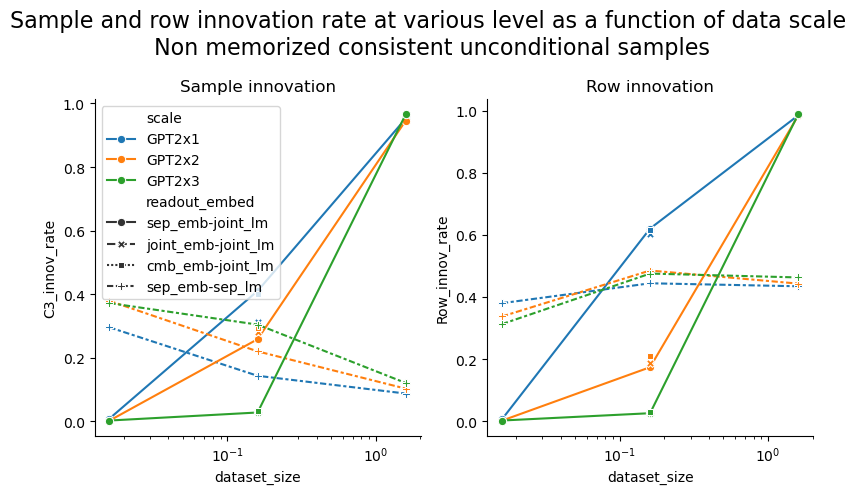

In [25]:
figh, axs = plt.subplots(1, 2, figsize=(8, 5))
for ax, frac, title in zip(axs, ['C3_innov_rate', 'Row_innov_rate', ],
                           ["Sample innovation", "Row innovation", ]):
    sns.lineplot(data=mem_syn_df_GPT2, x="dataset_size", y=frac, hue="scale", 
                 markers=True, dashes=True, ax=ax, marker="o", style="readout_embed", 
                 style_order=["sep_emb-joint_lm","joint_emb-joint_lm", "cmb_emb-joint_lm", "sep_emb-sep_lm", ],
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
    if ax != axs[0]:
        ax.legend_.remove()
plt.suptitle("Sample and row innovation rate at various level as a function of data scale\n Non memorized consistent unconditional samples", fontsize=16)
plt.tight_layout()
saveallforms(memsyndir, "GPT2_innovation_rate_scaling_curve_all_readout_embed", figh)
plt.show()

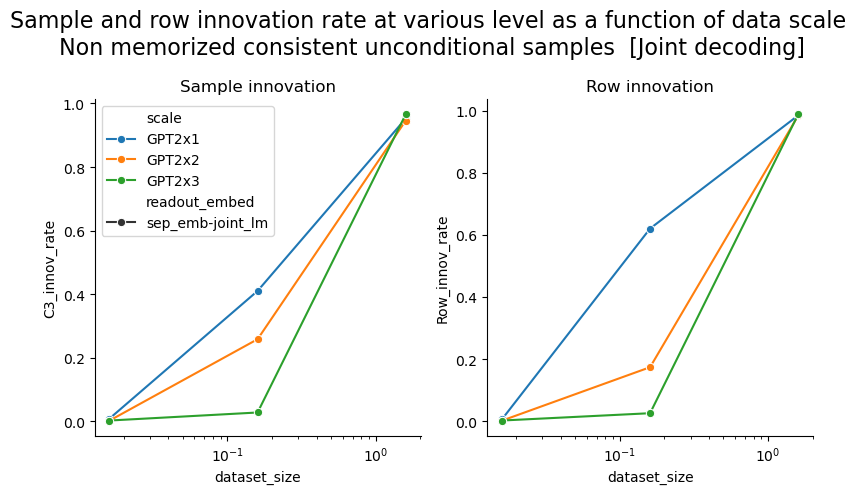

In [26]:
figh, axs = plt.subplots(1, 2, figsize=(8, 5))
for ax, frac, title in zip(axs, ['C3_innov_rate', 'Row_innov_rate', ],
                           ["Sample innovation", "Row innovation", ]):
    sns.lineplot(data=mem_syn_df_GPT2, x="dataset_size", y=frac, hue="scale", 
                 markers=True, dashes=True, ax=ax, marker="o", style="readout_embed", 
                 style_order=["sep_emb-joint_lm",],
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
    if ax != axs[0]:
        ax.legend_.remove()
plt.suptitle("Sample and row innovation rate at various level as a function of data scale\n Non memorized consistent unconditional samples  [Joint decoding]", fontsize=16)
plt.tight_layout()
saveallforms(memsyndir, "GPT2_innovation_rate_scaling_curve_joint_sep_readout_embed", figh)
plt.show()

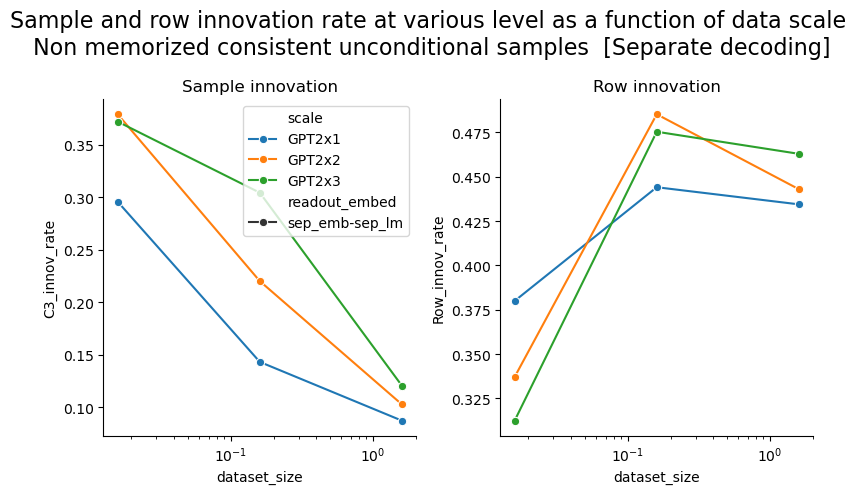

In [27]:
figh, axs = plt.subplots(1, 2, figsize=(8, 5))
for ax, frac, title in zip(axs, ['C3_innov_rate', 'Row_innov_rate', ],
                           ["Sample innovation", "Row innovation", ]):
    sns.lineplot(data=mem_syn_df_GPT2, x="dataset_size", y=frac, hue="scale", 
                 markers=True, dashes=True, ax=ax, marker="o", style="readout_embed", 
                 style_order=["sep_emb-sep_lm",],
                 hue_order=["GPT2x1", "GPT2x2", "GPT2x3"])
    ax.set_xscale('log')
    ax.set_title(title)
    if ax != axs[0]:
        ax.legend_.remove()
plt.suptitle("Sample and row innovation rate at various level as a function of data scale\n Non memorized consistent unconditional samples  [Separate decoding]", fontsize=16)
plt.tight_layout()
saveallforms(memsyndir, "GPT2_innovation_rate_scaling_curve_sep_sep_readout_embed", figh)
plt.show()

## DiT

In [16]:
figroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics"
tabdir = "/n/home12/binxuwang/Github/DiffusionReasoning/Tables"
GPT_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/GPT2_raven"
DiT_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results"
SSM_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/Mamba_raven"
EDM_exproot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/mini_edm/exps"

syndf_DiT = pd.read_csv(join(tabdir, "DiT_raven_tensorboard_data_last10.csv"), index_col=0)
tb_data_col_DiT = pkl.load(open(join(tabdir, "DiT_raven_tensorboard_raw_data.pkl"), "rb"))

In [5]:
success_syndf = syndf_DiT.query("step > 900000")
success_syndf

,Loss/average,Loss/batch,Rules/anyvalid,Rules/anyvalid_cnt,Rules/c2,Rules/c2_cnt,Rules/c3,Rules/c3_cnt,Speed/steps_per_sec,full_name,...,step/epoch,Loss/average_std,Loss/batch_std,Rules/anyvalid_std,Rules/anyvalid_cnt_std,Rules/c2_std,Rules/c2_cnt_std,Rules/c3_std,Rules/c3_cnt_std,Speed/steps_per_sec_std
run_name,,,,,,,,,,,,,,,,,,,,,
085-uncond-DiT_S_1-stream0_16M,0.094250,0.093119,0.753874,4631.8,0.122949,251.8,0.602930,1234.8,18.911798,085-RAVEN10_abstract-uncond-DiT_S_1-stream0_16...,...,977500,0.000787,0.007092,0.023433,143.975152,0.010715,21.943361,0.026732,54.747501,0.520298
086-uncond-DiT_S_1-stream1_6M,0.094534,0.094586,0.767692,4716.7,0.135107,276.7,0.613086,1255.6,19.068166,086-RAVEN10_abstract-uncond-DiT_S_1-stream1_6M...,...,977500,0.000738,0.005965,0.027885,171.326232,0.011065,22.662009,0.038581,79.013642,0.074948
087-uncond-DiT_S_1-stream16M,0.094520,0.095650,0.782910,4810.2,0.130811,267.9,0.631982,1294.3,18.946301,087-RAVEN10_abstract-uncond-DiT_S_1-stream16M_...,...,977500,0.000667,0.004046,0.015262,93.768983,0.008754,17.928562,0.015125,30.976873,0.775090
088-uncond-DiT_S_1-stream16M_heldout0,0.095964,0.096755,0.768522,4721.8,0.125732,257.5,0.619727,1269.2,19.285516,088-RAVEN10_abstract-uncond-DiT_S_1-stream16M_...,...,977500,0.000607,0.005439,0.026068,160.160891,0.009619,19.699126,0.034727,71.120867,0.004874
089-uncond-DiT_S_1-stream1_6M_heldout0,0.096124,0.097144,0.759196,4664.5,0.135449,277.4,0.602393,1233.7,19.265524,089-RAVEN10_abstract-uncond-DiT_S_1-stream1_6M...,...,977500,0.000591,0.005565,0.016120,99.041237,0.010711,21.935258,0.020437,41.854377,0.018285
090-uncond-DiT_S_1-stream0_16M_heldout0,0.095820,0.097285,0.747510,4592.7,0.134717,275.9,0.585352,1198.8,18.690334,090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16...,...,977500,0.000667,0.003614,0.014643,89.964252,0.004820,9.870832,0.017124,35.070722,0.676310
091-uncond-DiT_B_1-stream16M,0.094528,0.095505,0.789095,4848.2,0.122607,251.1,0.646924,1324.9,8.740444,091-RAVEN10_abstract-uncond-DiT_B_1-stream16M_...,...,977500,0.000750,0.003961,0.023185,142.451395,0.008760,17.940953,0.031696,64.912676,0.164379
092-uncond-DiT_B_1-stream1_6M,0.094594,0.092389,0.777067,4774.3,0.121289,248.4,0.638916,1308.5,8.753056,092-RAVEN10_abstract-uncond-DiT_B_1-stream1_6M...,...,977500,0.000568,0.004284,0.018436,113.268658,0.012075,24.730548,0.025911,53.066520,0.014044
093-uncond-DiT_B_1-stream1_6M_heldout0,0.095826,0.096923,0.783219,4812.1,0.128613,263.4,0.638379,1307.4,8.790528,093-RAVEN10_abstract-uncond-DiT_B_1-stream1_6M...,...,977500,0.000649,0.005122,0.024339,149.541856,0.010031,20.543720,0.033947,69.524097,0.004066


In [6]:
success_syndf.loc["090-uncond-DiT_S_1-stream0_16M_heldout0"].full_name

'090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/tensorboard_logs'

090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/tensorboard_logs
Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/samples
example file: 0155000.pt


  0%|          | 0/401 [00:00<?, ?it/s]

Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/samples
example file: ['0155000.pt', '0422500.pt', '0432500.pt', '0715000.pt', '0787500.pt', '0072500.pt', '0277500.pt', 'sample_rule_eval_465000.pt', 'sample_rule_eval_602500.pt', '0707500.pt']


  0%|          | 0/401 [00:00<?, ?it/s]

examples_per_rule: 4000


  0%|          | 0/401 [00:00<?, ?it/s]

       epoch    C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000  1181  286   4552   2048              0             0.0   
397   992500  1243  276   4704   2048              0             0.0   
398   995000  1244  255   4723   2048              0             0.0   
399   997500  1240  273   4695   2048              0             0.0   
400  1000000  1170  291   4514   2048              0             0.0   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396           0          0.0        6752  ...             13771   
397           0          0.0        6536  ...             14113   
398           0          0.0        6409  ...             13756   
399           0          0.0        6670  ...             13770   
400           0          0.0        6017  ...             13513   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.747125                11           0.001790             13712   
39

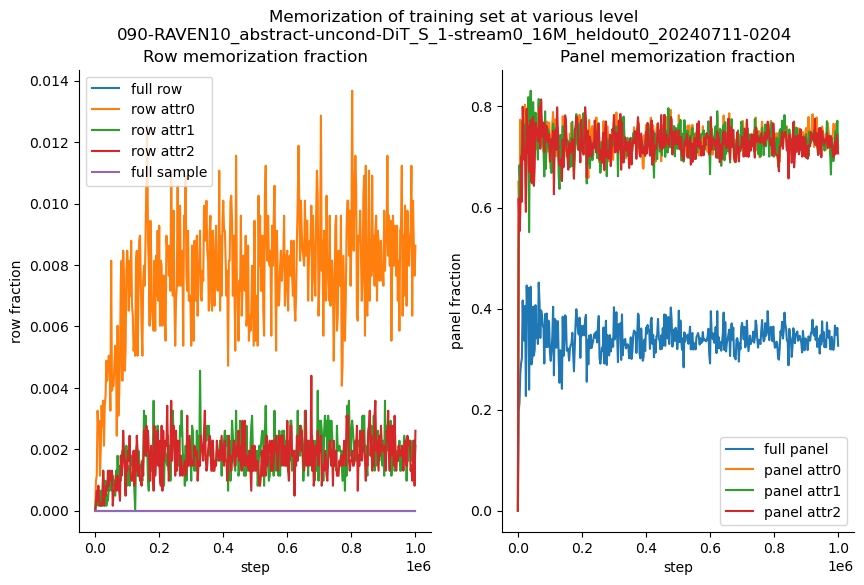

name 'heldout_ids' is not defined
Not enough control set, skip
samples in control set: 4000


NameError: name 'ctrl_X_sample_set' is not defined

In [30]:
# %%
success_syndf = syndf_DiT.query("step > 900000")
# expfullname = 'GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019/tensorboard_logs'
# for expfullname in success_syndf.full_name.values:
expfullname = '090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/tensorboard_logs'
print(expfullname)
expname = expfullname.split("/tensorboard_logs")[0]
figexpdir = join(figroot, expname)
os.makedirs(figexpdir, exist_ok=True)

prefix = "sample_rule_eval_" #"eval_step" if "stream" in expname else "eval_epoch"
eval_col = sweep_collect_eval_data(expname, DiT_exproot, prefix=prefix)
sample_col = sweep_collect_sample(expname, DiT_exproot, non_prefix=prefix)
dataset_size = extract_and_convert(expname)
examples_per_rule = int(dataset_size * 1E6 / 40)
print(f"examples_per_rule: {examples_per_rule}")
if examples_per_rule > 100000:
    raise ValueError("Too many examples per rule")

train_tsr_X, train_tsr_y = get_RAVEN_dataset(n_classes=40, cmb_per_class=examples_per_rule, heldout_ids=(), cmb_offset=0, cache=True)
train_X_sample_set, train_X_row_set, train_X_panel_set, train_X_row_set_attr_col, train_X_panel_set_attr_col = extract_training_set_row_panel_sets(train_tsr_X)
mem_stats_df = compute_memorization_tab_through_training(sample_col, eval_col, train_X_sample_set, train_X_row_set, train_X_panel_set, train_X_row_set_attr_col, train_X_panel_set_attr_col, abinit=True)
mem_stats_df.to_csv(join(figexpdir, "memorization_stats_train_set.csv"))
print(mem_stats_df.tail(5))
figh = visualize_memorization_dynamics(mem_stats_df, expname=expname)
saveallforms(figexpdir, "memorization_dynamics_train_set", figh)

try:
    ctrl_tsr_X, ctrl_tsr_y = get_RAVEN_dataset(n_classes=40, cmb_per_class=examples_per_rule, heldout_ids=(), cmb_offset=20000, cache=True)
    ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col = extract_training_set_row_panel_sets(ctrl_tsr_X)
except Exception as e:
    print(e)
    print("Not enough control set, skip")
    print("samples in control set:", examples_per_rule)   
    # continue
    raise Exception("stop here")
mem_stats_ctrl_df = compute_memorization_tab_through_training(sample_col, eval_col, ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col, abinit=True)
mem_stats_ctrl_df.to_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"))
print(mem_stats_ctrl_df.tail(5))
figh2 = visualize_memorization_dynamics(mem_stats_ctrl_df, expname=expname+' Control set')
saveallforms(figexpdir, "memorization_dynamics_ctrl_set", figh2)

  0%|          | 0/401 [00:00<?, ?it/s]

       epoch    C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000  1181  286   4552   2048              0             0.0   
397   992500  1243  276   4704   2048              0             0.0   
398   995000  1244  255   4723   2048              0             0.0   
399   997500  1240  273   4695   2048              0             0.0   
400  1000000  1170  291   4514   2048              0             0.0   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396           0          0.0        6683  ...             13761   
397           0          0.0        6476  ...             14136   
398           0          0.0        6405  ...             13738   
399           0          0.0        6650  ...             13775   
400           0          0.0        6025  ...             13516   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.746582                 8           0.001302             13706   
39

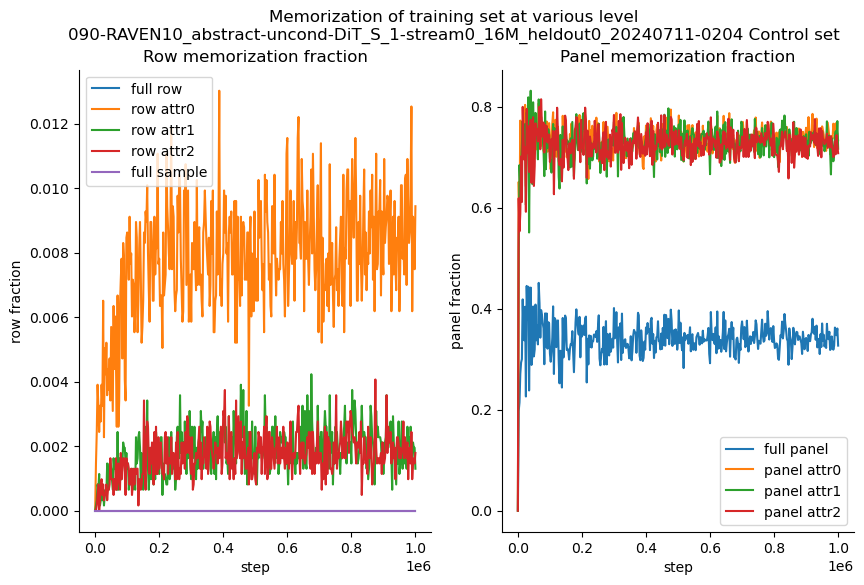

In [31]:

try:
    ctrl_tsr_X, ctrl_tsr_y = get_RAVEN_dataset(n_classes=40, cmb_per_class=examples_per_rule, heldout_ids=(), cmb_offset=20000, cache=True)
    ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col = extract_training_set_row_panel_sets(ctrl_tsr_X)
except Exception as e:
    print(e)
    print("Not enough control set, skip")
    print("samples in control set:", examples_per_rule)   
    # continue
mem_stats_ctrl_df = compute_memorization_tab_through_training(sample_col, eval_col, ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col, abinit=True)
mem_stats_ctrl_df.to_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"))
print(mem_stats_ctrl_df.tail(5))
figh2 = visualize_memorization_dynamics(mem_stats_ctrl_df, expname=expname+' Control set')
saveallforms(figexpdir, "memorization_dynamics_ctrl_set", figh2)

In [32]:
sum_df = mem_stats_df.tail(10).mean()

In [33]:
# show only columns containing the word "frac"
sum_df.loc[sum_df.index.str.contains('frac')]

mem_samplefrac       0.000000
mem_rowfrac          0.000000
mem_panfrac          0.339773
mem_attr0_rowfrac    0.008724
mem_attr0_panfrac    0.747792
mem_attr1_rowfrac    0.002002
mem_attr1_panfrac    0.723758
mem_attr2_rowfrac    0.001774
mem_attr2_panfrac    0.719537
dtype: float64

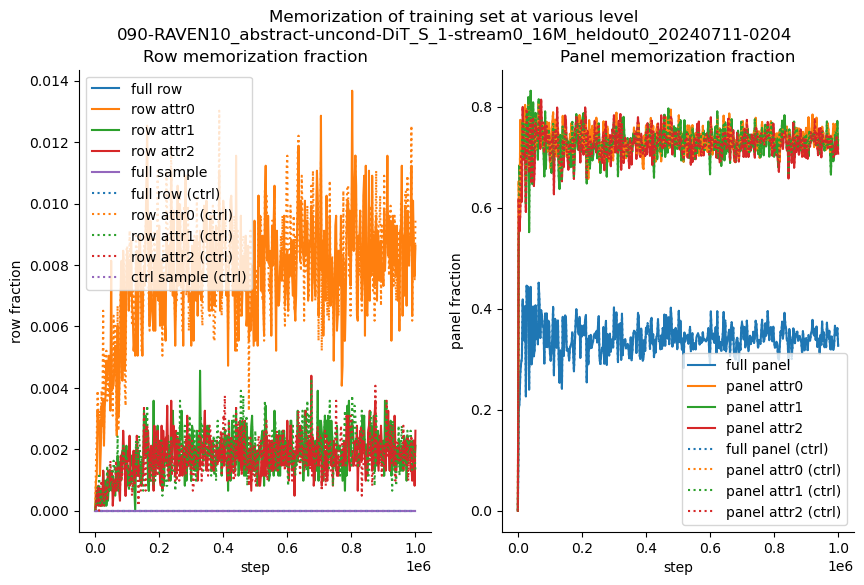

In [46]:
figh = visualize_memorization_with_ctrl_dynamics(mem_stats_df, mem_stats_ctrl_df, expname=expname)
saveallforms(figexpdir, "memorization_dynamics_train_ctrl_set_combined", figh)

## Run through models

In [9]:
syndf_diff = pd.read_csv(join(tabdir, "diffusion_family_comb_tensorboard_data_last10.csv"), index_col=0)    

In [12]:
syndf_diff.query("step > 900000 and model_class == 'DiT' and dataset_size == 0.016 and heldout == True")

,Learning Rate,Loss/average,Loss/batch,Rules/anyvalid,Rules/anyvalid_cnt,Rules/c2,Rules/c2_cnt,Rules/c3,Rules/c3_cnt,full_name,...,Rules/c23_cnt,scale,c3_CI_L,c3_CI_H,c23_CI_L,c23_CI_H,c2_CI_L,c2_CI_H,valid_CI_L,valid_CI_H
run_name,,,,,,,,,,,,,,,,,,,,,
098-uncond-DiT_S_1-stream0_016M_heldout0,NaN,0.035150,0.037058,0.414632,2547.5,0.061719,126.4,0.003857,7.9,098-RAVEN10_abstract-uncond-DiT_S_1-stream0_01...,...,134.3,DiT-S/1,0.003027,0.004736,0.062207,0.068994,0.058447,0.065039,0.410742,0.418522
101-uncond-DiT_B_1-stream0_016M_heldout0,NaN,0.021564,0.022078,0.396436,2435.7,0.068457,140.2,0.032422,66.4,101-RAVEN10_abstract-uncond-DiT_B_1-stream0_01...,...,206.6,DiT-B/1,0.030029,0.034863,0.096777,0.105029,0.065039,0.071924,0.392562,0.400309


098-RAVEN10_abstract-uncond-DiT_S_1-stream0_016M_heldout0_20240816-0050/tensorboard_logs
Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/098-RAVEN10_abstract-uncond-DiT_S_1-stream0_016M_heldout0_20240816-0050/samples
example file: 0155000.pt


  0%|          | 0/401 [00:00<?, ?it/s]

Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/098-RAVEN10_abstract-uncond-DiT_S_1-stream0_016M_heldout0_20240816-0050/samples
example file: ['0155000.pt', '0422500.pt', '0432500.pt', '0715000.pt', '0787500.pt', '0072500.pt', '0277500.pt', 'sample_rule_eval_465000.pt', 'sample_rule_eval_602500.pt', '0707500.pt']


  0%|          | 0/401 [00:00<?, ?it/s]

examples_per_rule: 400


  0%|          | 0/401 [00:00<?, ?it/s]

       epoch  C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000   9  122   2522   2048              0             0.0   
397   992500   4  124   2501   2048              0             0.0   
398   995000   8  107   2407   2048              0             0.0   
399   997500  15  121   2533   2048              0             0.0   
400  1000000   5  128   2610   2048              0             0.0   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396           0     0.000000        1242  ...              8658   
397           2     0.000326        1425  ...              9480   
398           0     0.000000        1221  ...              8170   
399           0     0.000000        1386  ...              8930   
400           0     0.000000        1326  ...              8689   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.469727                 3           0.000488              9309   
397           

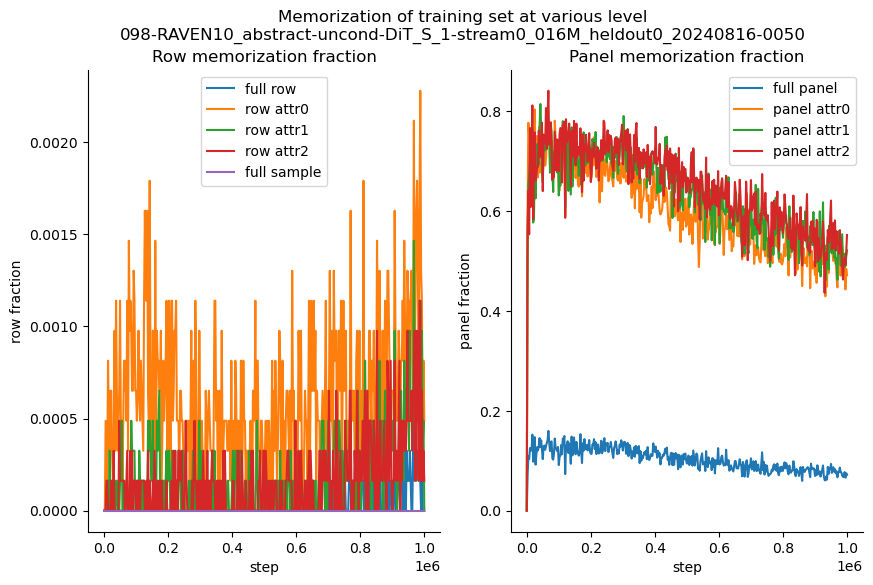

  0%|          | 0/401 [00:00<?, ?it/s]

       epoch  C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000   9  122   2522   2048              0             0.0   
397   992500   4  124   2501   2048              0             0.0   
398   995000   8  107   2407   2048              0             0.0   
399   997500  15  121   2533   2048              0             0.0   
400  1000000   5  128   2610   2048              0             0.0   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396           0          0.0        1226  ...              8639   
397           0          0.0        1390  ...              9466   
398           0          0.0        1152  ...              8151   
399           0          0.0        1314  ...              8932   
400           0          0.0        1361  ...              8715   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.468696                 1           0.000163              9289   
397           

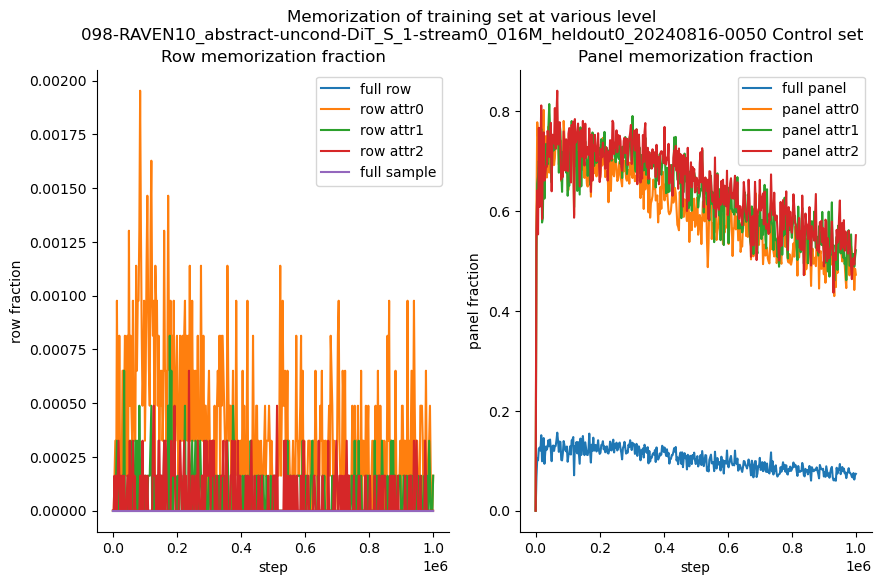

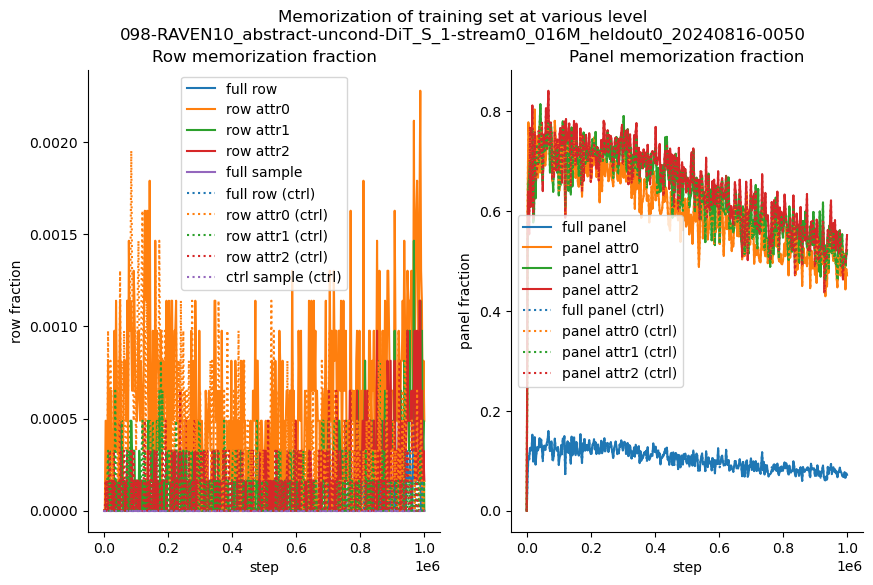

101-RAVEN10_abstract-uncond-DiT_B_1-stream0_016M_heldout0_20240921-1650/tensorboard_logs
Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/101-RAVEN10_abstract-uncond-DiT_B_1-stream0_016M_heldout0_20240921-1650/samples
example file: 0155000.pt


  0%|          | 0/401 [00:00<?, ?it/s]

Extracted data from /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiT/results/101-RAVEN10_abstract-uncond-DiT_B_1-stream0_016M_heldout0_20240921-1650/samples
example file: ['0155000.pt', '0422500.pt', '0432500.pt', '0715000.pt', '0787500.pt', '0072500.pt', '0277500.pt', 'sample_rule_eval_465000.pt', 'sample_rule_eval_602500.pt', '0707500.pt']


  0%|          | 0/401 [00:00<?, ?it/s]

examples_per_rule: 400


  0%|          | 0/401 [00:00<?, ?it/s]

       epoch  C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000  62  132   2475   2048             12        0.005859   
397   992500  68  144   2422   2048             16        0.007812   
398   995000  54  162   2501   2048             18        0.008789   
399   997500  70  125   2360   2048             14        0.006836   
400  1000000  78  131   2412   2048             31        0.015137   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396         105     0.017090        1545  ...              7420   
397         161     0.026204        1805  ...              7765   
398         150     0.024414        1939  ...              8403   
399         160     0.026042        1601  ...              7964   
400         194     0.031576        2025  ...              8552   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.402561               200           0.032552              6496   
397           

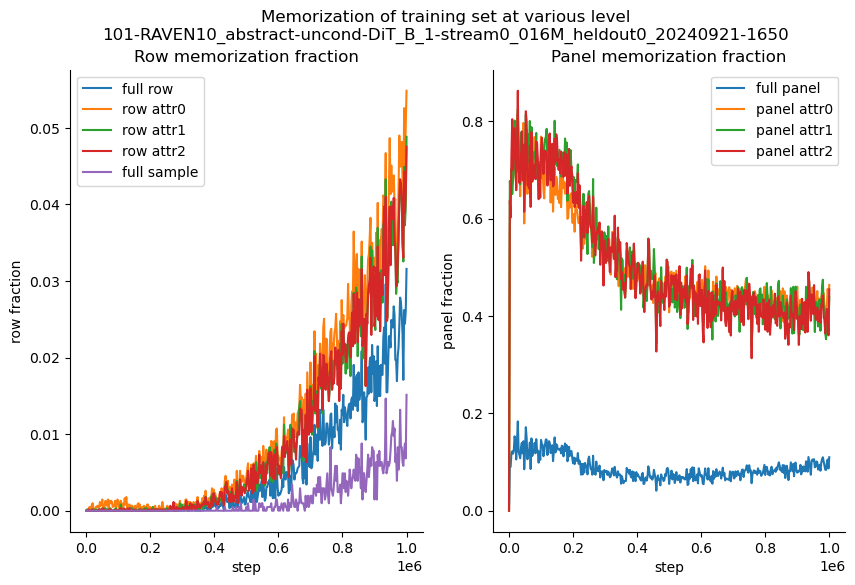

  0%|          | 0/401 [00:00<?, ?it/s]

       epoch  C3   C2  valid  total  mem_samplecnt  mem_samplefrac  \
396   990000  62  132   2475   2048              0             0.0   
397   992500  68  144   2422   2048              0             0.0   
398   995000  54  162   2501   2048              0             0.0   
399   997500  70  125   2360   2048              0             0.0   
400  1000000  78  131   2412   2048              0             0.0   

     mem_rowcnt  mem_rowfrac  mem_pancnt  ...  mem_attr0_pancnt  \
396           0          0.0         979  ...              7246   
397           0          0.0        1070  ...              7494   
398           0          0.0        1284  ...              8259   
399           0          0.0         920  ...              7779   
400           0          0.0        1242  ...              8346   

     mem_attr0_panfrac  mem_attr1_rowcnt  mem_attr1_rowfrac  mem_attr1_pancnt  \
396           0.393121                 0           0.000000              6326   
397           

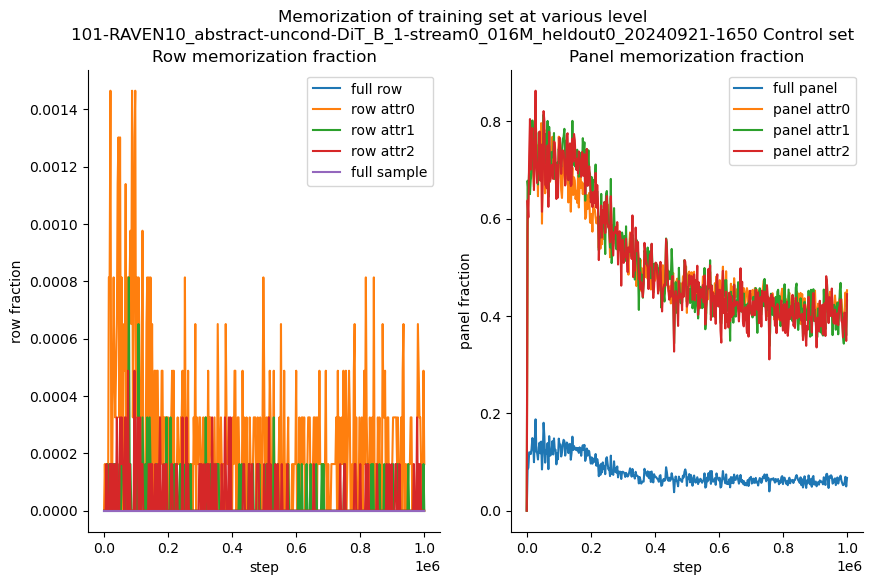

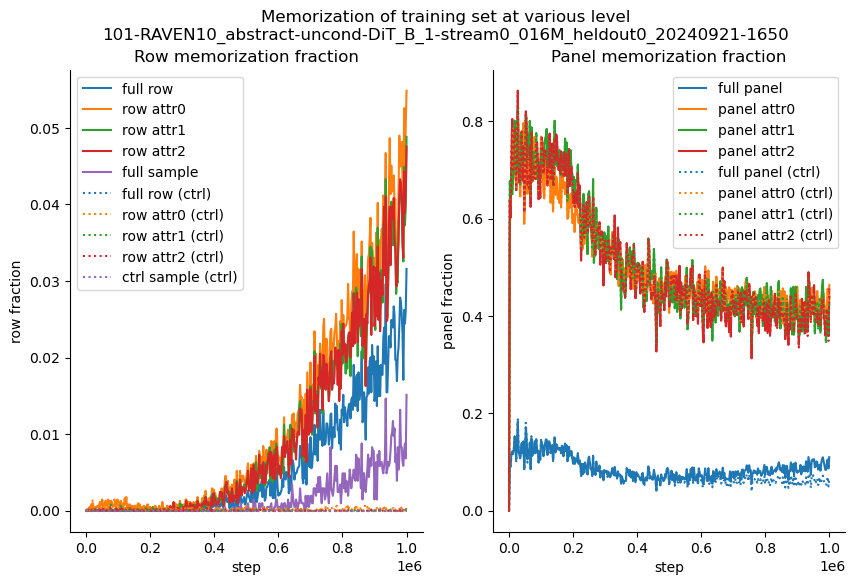

In [13]:
# %%
partial_syndf = syndf_diff.query("step > 900000 and model_class == 'DiT' and dataset_size == 0.016 and heldout == True")
# expfullname = 'GPT2_medium_RAVEN_uncond_heldout0_stream0_16M-20240820-024019/tensorboard_logs'
# for expfullname in success_syndf.full_name.values:
# expfullname = '090-RAVEN10_abstract-uncond-DiT_S_1-stream0_16M_heldout0_20240711-0204/tensorboard_logs'
for expfullname in partial_syndf.full_name.values:
    print(expfullname)
    expname = expfullname.split("/tensorboard_logs")[0]
    figexpdir = join(figroot, expname)
    os.makedirs(figexpdir, exist_ok=True)
    prefix = "sample_rule_eval_" #"eval_step" if "stream" in expname else "eval_epoch"
    eval_col = sweep_collect_eval_data(expname, DiT_exproot, prefix=prefix)
    sample_col = sweep_collect_sample(expname, DiT_exproot, non_prefix=prefix)
    dataset_size = extract_and_convert(expname)
    examples_per_rule = int(dataset_size * 1E6 / 40)
    print(f"examples_per_rule: {examples_per_rule}")
    if examples_per_rule > 45000:
        raise ValueError("Too many examples per rule")

    train_tsr_X, train_tsr_y = get_RAVEN_dataset(n_classes=40, cmb_per_class=examples_per_rule, heldout_ids=(), cmb_offset=0, cache=True)
    train_X_sample_set, train_X_row_set, train_X_panel_set, train_X_row_set_attr_col, train_X_panel_set_attr_col = extract_training_set_row_panel_sets(train_tsr_X)
    mem_stats_df = compute_memorization_tab_through_training(sample_col, eval_col, train_X_sample_set, train_X_row_set, train_X_panel_set, train_X_row_set_attr_col, train_X_panel_set_attr_col, abinit=True)
    mem_stats_df.to_csv(join(figexpdir, "memorization_stats_train_set.csv"))
    print(mem_stats_df.tail(5))
    figh = visualize_memorization_dynamics(mem_stats_df, expname=expname)
    saveallforms(figexpdir, "memorization_dynamics_train_set", figh)

    try:
        ctrl_tsr_X, ctrl_tsr_y = get_RAVEN_dataset(n_classes=40, cmb_per_class=examples_per_rule, heldout_ids=(), cmb_offset=45000, cache=True)
        ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col = extract_training_set_row_panel_sets(ctrl_tsr_X)
    except Exception as e:
        print(e)
        print("Not enough control set, skip")
        print("samples in control set:", examples_per_rule)   
        # continue
        raise Exception("stop here")
    mem_stats_ctrl_df = compute_memorization_tab_through_training(sample_col, eval_col, ctrl_X_sample_set, ctrl_X_row_set, ctrl_X_panel_set, ctrl_X_row_set_attr_col, ctrl_X_panel_set_attr_col, abinit=True)
    mem_stats_ctrl_df.to_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"))
    print(mem_stats_ctrl_df.tail(5))
    figh2 = visualize_memorization_dynamics(mem_stats_ctrl_df, expname=expname+' Control set')
    saveallforms(figexpdir, "memorization_dynamics_ctrl_set", figh2)

    figh3 = visualize_memorization_with_ctrl_dynamics(mem_stats_df, mem_stats_ctrl_df, expname=expname)
    saveallforms(figexpdir, "memorization_dynamics_train_ctrl_set_combined", figh3)

In [23]:
syndf_diff.query("step > 900000 and dataset_size == 0.16 and heldout == True and model_class == 'EDM'").full_name.values

array(['BaseBlnrX3_new_stream0_16M_heldout0_RAVEN10_abstract_20240921-2218/tensorboard_logs',
       'BigBlnrX3_new_stream0_16M_heldout0_RAVEN10_abstract_20240708-2308/tensorboard_logs',
       'BigBlnrX3_new_stream0_16M_heldout0_RAVEN10_abstract_20240709-1249/tensorboard_logs',
       'WideBlnrX3_new_stream0_16M_heldout0_RAVEN10_abstract_20240708-2054/tensorboard_logs'],
      dtype=object)

In [ ]:
EDM_exproot

In [ ]:
!ls {EDM_exproot}/BaseBlnrX3_new_stream0_16M_heldout0_RAVEN10_abstract_20240921-2218/samples

In [26]:
syndf_diff.query("step > 900000 and dataset_size == 0.016 and heldout == True and model_class == 'DiT'").full_name.values

array(['098-RAVEN10_abstract-uncond-DiT_S_1-stream0_016M_heldout0_20240816-0050/tensorboard_logs',
       '101-RAVEN10_abstract-uncond-DiT_B_1-stream0_016M_heldout0_20240921-1650/tensorboard_logs'],
      dtype=object)

## All model synopsis

In [10]:
memroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics"
memsyndir = join(memroot, "synopsis")
os.makedirs(memsyndir, exist_ok=True)

In [11]:
syndf_diff = pd.read_csv(join(tabdir, "diffusion_family_comb_tensorboard_data_last10.csv"), index_col=0)    

In [57]:
# Define the root directory
# Iterate through all subdirectories and files
mem_syn_col = {}
mem_syn_ctrl_col = {}
for figexpdir, _, files in os.walk(memroot):
    # Get the experiment name
    expname = os.path.basename(figexpdir)
    try:
        mem_stats_df = pd.read_csv(join(figexpdir, "memorization_stats_train_set.csv"), index_col=0)
        mem_stats_ctrl_df = pd.read_csv(join(figexpdir, "memorization_stats_ctrl_set.csv"), index_col=0)
    except FileNotFoundError:
        print(f"Skipping {expname}")
        continue    
    last_epoch_stats = mem_stats_df.iloc[-10:].mean()
    last_epoch_stats['expname'] = expname
    last_epoch_stats_ctrl = mem_stats_ctrl_df.iloc[-10:].mean()
    last_epoch_stats_ctrl['expname'] = expname
    mem_syn_col[expname] = last_epoch_stats
    mem_syn_ctrl_col[expname] = last_epoch_stats_ctrl

mem_syn_df = pd.DataFrame(mem_syn_col).T
mem_syn_ctrl_df = pd.DataFrame(mem_syn_ctrl_col).T

Skipping memorization_dynamics
Skipping GPT2_medium_RAVEN_uncond_heldout0_stream16M-20240820-024718
Skipping GPT2_small_RAVEN_uncond_heldout0_stream16M-20240820-024127
Skipping 087-RAVEN10_abstract-uncond-DiT_S_1-stream16M_20240711-0204
Skipping synopsis
Skipping GPT2_small_RAVEN_uncond_heldout0_stream1_6M-20240820-024123
Skipping GPT2_base_RAVEN_uncond_heldout0_stream16M-20240820-024031
Skipping 088-RAVEN10_abstract-uncond-DiT_S_1-stream16M_heldout0_20240711-0204


In [18]:
# show data types
mem_syn_df.dtypes

epoch                object
C3                   object
C2                   object
valid                object
total                object
mem_samplecnt        object
mem_samplefrac       object
mem_rowcnt           object
mem_rowfrac          object
mem_pancnt           object
mem_panfrac          object
mem_attr0_rowcnt     object
mem_attr0_rowfrac    object
mem_attr0_pancnt     object
mem_attr0_panfrac    object
mem_attr1_rowcnt     object
mem_attr1_rowfrac    object
mem_attr1_pancnt     object
mem_attr1_panfrac    object
mem_attr2_rowcnt     object
mem_attr2_rowfrac    object
mem_attr2_pancnt     object
mem_attr2_panfrac    object
expname              object
dtype: object

In [58]:
mem_syn_df.to_csv(join(memsyndir, "All_memorization_synopsis.csv"))
mem_syn_ctrl_df.to_csv(join(memsyndir, "All_memorization_ctrl_synopsis.csv"))

In [20]:
# create column from index
mem_syn_df['expname'] = mem_syn_df.index

In [59]:
# join table with mem_syn_df
syndf_diff["expname"] = syndf_diff.full_name.apply(lambda x: x.split("/tensorboard_logs")[0])
memsyndf_diff = syndf_diff.join(mem_syn_df, on="expname", how="left", rsuffix="_mem")
memsyndf_diff = memsyndf_diff.drop(columns=["expname_mem"])
memsyndf_diff = memsyndf_diff.join(mem_syn_ctrl_df, on="expname", how="left", rsuffix="_ctrl")
memsyndf_diff.to_csv(join(tabdir, "diffusion_family_comb_tensorboard_data_last10_w_memorization.csv"))

In [43]:
memsyndf_diff.query("step > 900000 and heldout == True and dataset_size == 0.016 ").mem_panfrac # and model_class == 'DiT'

run_name
BigBlnrX3_new_stream0_016M_heldout0                       0.190956
WideBlnrX3_new_stream0_016M_heldout0                      0.129628
098-uncond-DiT_S_1-stream0_016M_heldout0                  0.066813
101-uncond-DiT_B_1-stream0_016M_heldout0                  0.093224
013-SiT_S_1-stream0_016M_heldout0-Linear-velocity-None    0.079308
015-SiT_B_1-stream0_016M_heldout0-Linear-velocity-None    0.227724
Name: mem_panfrac, dtype: object

In [49]:
partial_df = memsyndf_diff.query("step > 900000 and heldout == True and dataset_size == 0.016 ") # and model_class == 'DiT'
print(partial_df.mem_samplefrac)
print(partial_df.mem_rowfrac)
print(partial_df.mem_panfrac)

run_name
BigBlnrX3_new_stream0_016M_heldout0                       0.034033
WideBlnrX3_new_stream0_016M_heldout0                           0.0
098-uncond-DiT_S_1-stream0_016M_heldout0                  0.000146
101-uncond-DiT_B_1-stream0_016M_heldout0                  0.025326
013-SiT_S_1-stream0_016M_heldout0-Linear-velocity-None    0.005794
015-SiT_B_1-stream0_016M_heldout0-Linear-velocity-None    0.144873
Name: mem_rowfrac, dtype: object
run_name
BigBlnrX3_new_stream0_016M_heldout0                       0.015137
WideBlnrX3_new_stream0_016M_heldout0                           0.0
098-uncond-DiT_S_1-stream0_016M_heldout0                       0.0
101-uncond-DiT_B_1-stream0_016M_heldout0                   0.00874
013-SiT_S_1-stream0_016M_heldout0-Linear-velocity-None      0.0021
015-SiT_B_1-stream0_016M_heldout0-Linear-velocity-None    0.093213
Name: mem_samplefrac, dtype: object
run_name
BigBlnrX3_new_stream0_016M_heldout0                       0.190956
WideBlnrX3_new_stream0_016M_heldo

In [55]:
memsyndir

'/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/Figures/DiffusionReasoning/memorization_dynamics/synopsis'

In [64]:
partial_tab.columns

Index(['Learning Rate', 'Loss/average', 'Loss/batch', 'Rules/anyvalid',
       'Rules/anyvalid_cnt', 'Rules/c2', 'Rules/c2_cnt', 'Rules/c3',
       'Rules/c3_cnt', 'full_name', 'step', 'step/epoch', 'Learning Rate_std',
       'Loss/average_std', 'Loss/batch_std', 'Rules/anyvalid_std',
       'Rules/anyvalid_cnt_std', 'Rules/c2_std', 'Rules/c2_cnt_std',
       'Rules/c3_std', 'Rules/c3_cnt_std', 'model_class',
       'Speed/steps_per_sec', 'Speed/steps_per_sec_std', 'dataset_size',
       'heldout', 'Rules/c23', 'Rules/c23_cnt', 'scale', 'c3_CI_L', 'c3_CI_H',
       'c23_CI_L', 'c23_CI_H', 'c2_CI_L', 'c2_CI_H', 'valid_CI_L',
       'valid_CI_H', 'expname', 'epoch', 'C3', 'C2', 'valid', 'total',
       'mem_samplecnt', 'mem_samplefrac', 'mem_rowcnt', 'mem_rowfrac',
       'mem_pancnt', 'mem_panfrac', 'mem_attr0_rowcnt', 'mem_attr0_rowfrac',
       'mem_attr0_pancnt', 'mem_attr0_panfrac', 'mem_attr1_rowcnt',
       'mem_attr1_rowfrac', 'mem_attr1_pancnt', 'mem_attr1_panfrac',
       'mem

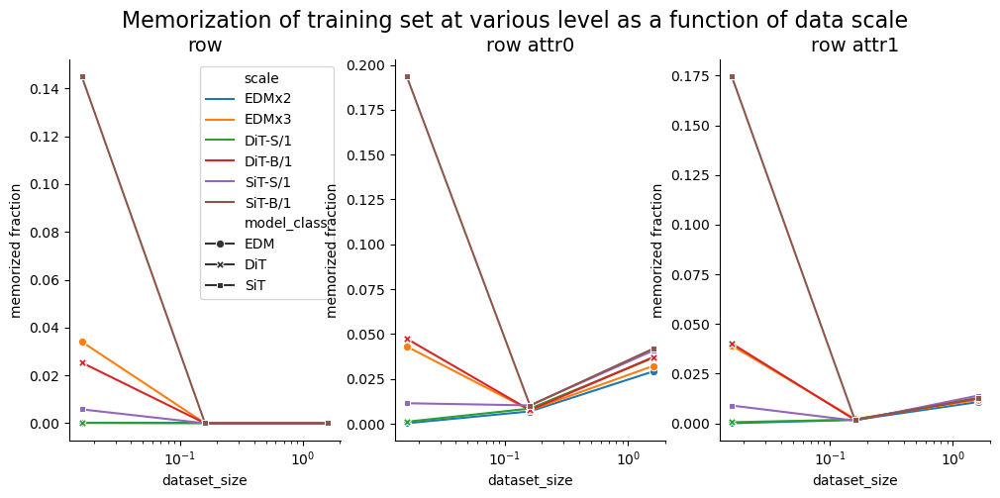

In [67]:
partial_tab = memsyndf_diff.query("step > 900000 and heldout == True")
# reset index
partial_tab = partial_tab.reset_index(drop=True)
figh, axs = plt.subplots(1,3,figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_rowfrac', 'mem_attr0_rowfrac', 'mem_attr1_rowfrac', ],
                           ['row', 'row attr0', 'row attr1']):
    sns.lineplot(data=partial_tab, x="dataset_size", y=frac, 
                 hue='scale', style="model_class", markers=True, dashes=False, ax=ax,
                 legend=False if ax != axs[0] else True,
                 hue_order=["EDMx2", "EDMx3", "DiT-S/1","DiT-B/1", "SiT-S/1","SiT-B/1",])
    ax.set_xscale('log')
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("memorized fraction")

plt.suptitle("Memorization of training set at various level as a function of data scale", fontsize=16)
# saveallforms(memsyndir, "diffusion_memorization_scaling_curve", figh)
plt.show()

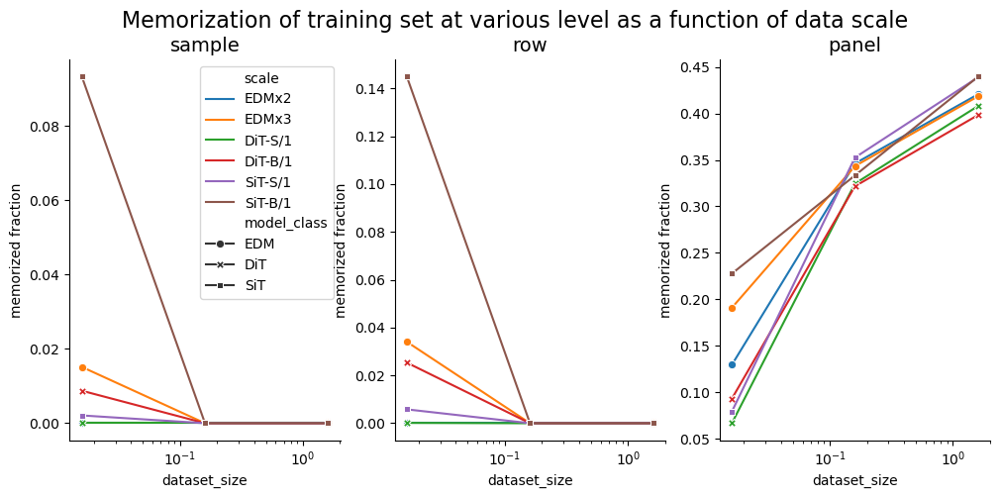

In [68]:
partial_tab = memsyndf_diff.query("step > 900000 and heldout == True")
# reset index
partial_tab = partial_tab.reset_index(drop=True)
figh, axs = plt.subplots(1,3,figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac', ],
                           ['sample', 'row', 'panel']):
    sns.lineplot(data=partial_tab, x="dataset_size", y=frac, 
                 hue='scale', style="model_class", markers=True, dashes=False, ax=ax,
                 legend=False if ax != axs[0] else True,
                 hue_order=["EDMx2", "EDMx3", "DiT-S/1","DiT-B/1", "SiT-S/1","SiT-B/1",])
    ax.set_xscale('log')
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("memorized fraction")

plt.suptitle("Memorization of training set at various level as a function of data scale", fontsize=16)
saveallforms(memsyndir, "diffusion_memorization_scaling_curve", figh)
plt.show()

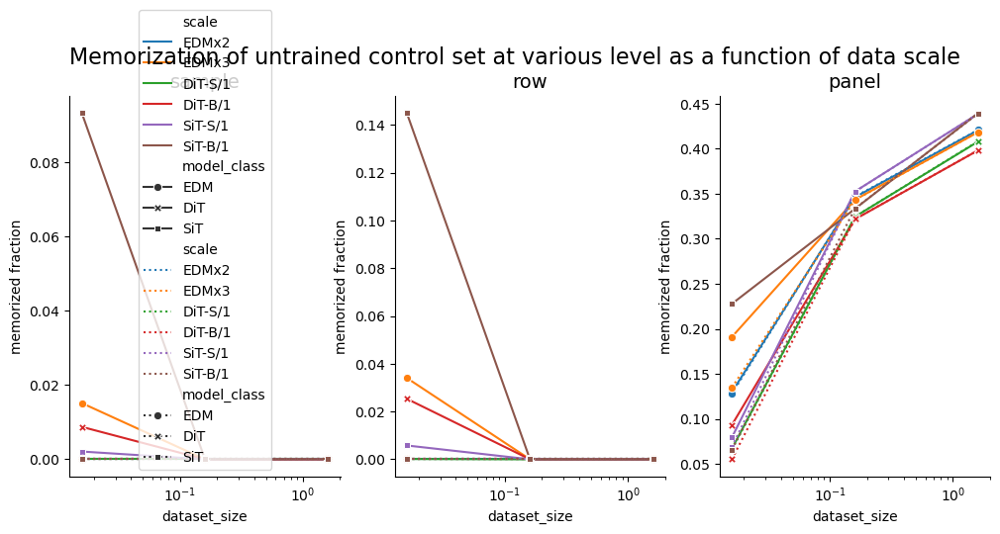

In [69]:
partial_tab = memsyndf_diff.query("step > 900000 and heldout == True")
# reset index
partial_tab = partial_tab.reset_index(drop=True)
figh, axs = plt.subplots(1,3,figsize=(12, 5))

for ax, frac, title in zip(axs, ['mem_samplefrac', 'mem_rowfrac', 'mem_panfrac', ],
                           ['sample', 'row', 'panel']):
    sns.lineplot(data=partial_tab, x="dataset_size", y=frac, 
                 hue='scale', style="model_class", markers=True, dashes=False, ax=ax,
                 legend=False if ax != axs[0] else True,
                 hue_order=["EDMx2", "EDMx3", "DiT-S/1","DiT-B/1", "SiT-S/1","SiT-B/1",])
for ax, frac, title in zip(axs, ['mem_samplefrac_ctrl', 'mem_rowfrac_ctrl', 'mem_panfrac_ctrl', ],
                           ['sample', 'row', 'panel']):
    sns.lineplot(data=partial_tab, x="dataset_size", y=frac, 
                 hue='scale', style="model_class", markers=True, dashes=False, ax=ax,
                 legend=False if ax != axs[0] else True,
                 hue_order=["EDMx2", "EDMx3", "DiT-S/1","DiT-B/1", "SiT-S/1","SiT-B/1",],
                 linestyle=':', )
    ax.set_xscale('log')
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("memorized fraction")

plt.suptitle("Memorization of untrained control set at various level as a function of data scale", fontsize=16)
saveallforms(memsyndir, "diffusion_memorization_ctrl_cmb_scaling_curve", figh)
plt.show()

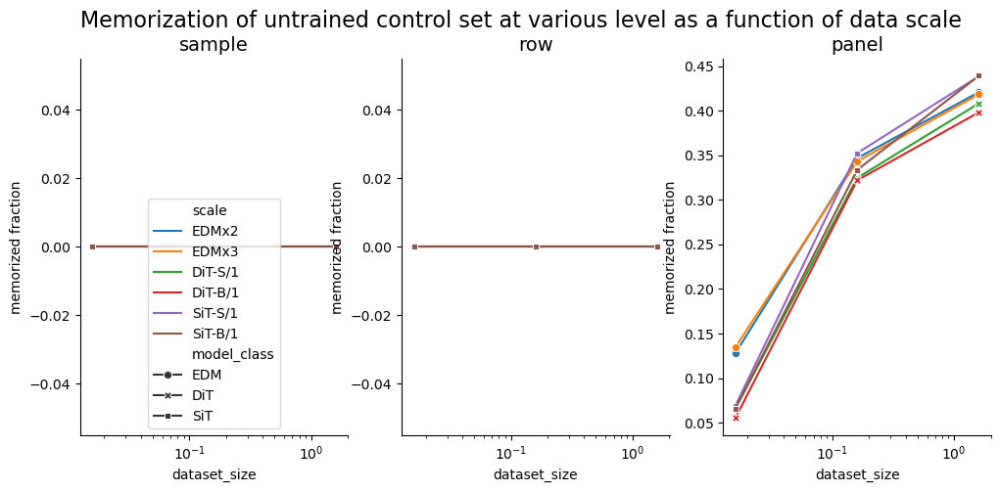

In [70]:
partial_tab = memsyndf_diff.query("step > 900000 and heldout == True")
# reset index
partial_tab = partial_tab.reset_index(drop=True)
figh, axs = plt.subplots(1,3,figsize=(12, 5))
for ax, frac, title in zip(axs, ['mem_samplefrac_ctrl', 'mem_rowfrac_ctrl', 'mem_panfrac_ctrl', ],
                           ['sample', 'row', 'panel']):
    sns.lineplot(data=partial_tab, x="dataset_size", y=frac, 
                 hue='scale', style="model_class", markers=True, dashes=False, ax=ax,
                 legend=False if ax != axs[0] else True,
                 hue_order=["EDMx2", "EDMx3", "DiT-S/1","DiT-B/1", "SiT-S/1","SiT-B/1",])
    ax.set_xscale('log')
    ax.set_title(title, fontsize=14)
    ax.set_ylabel("memorized fraction")

plt.suptitle("Memorization of untrained control set at various level as a function of data scale", fontsize=16)
saveallforms(memsyndir, "diffusion_memorization_ctrl_scaling_curve", figh)
plt.show()

In [58]:
partial_tab = memsyndf_diff.query("step > 900000 and dataset_size == 0.16 and heldout == True")
# show columns containing without cnt and without std
partial_tab.loc[:,['Rules/anyvalid','Rules/c2', 'Rules/c3', 'full_name', 'step', 'step/epoch',
'model_class', 'dataset_size', 'heldout',
'Rules/c23', 'scale', 'c3_CI_L', 'c3_CI_H', 'c23_CI_L', 'c23_CI_H',
'c2_CI_L', 'c2_CI_H', 'valid_CI_L', 'valid_CI_H', 'expname', 
'mem_samplefrac', 'mem_rowfrac',
'mem_panfrac', 'mem_attr0_rowfrac', 'mem_attr0_panfrac',
'mem_attr1_rowfrac', 'mem_attr1_panfrac', 'mem_attr2_rowfrac',
'mem_attr2_panfrac',]].to_csv(join(tabdir, "MainExp_memorization_synopsis_prune.csv"))

In [ ]:
'Rules/anyvalid','Rules/c2', 'Rules/c3', 'full_name', 'step', 'step/epoch',
'model_class', 'dataset_size', 'heldout',
'Rules/c23', 'scale', 'c3_CI_L', 'c3_CI_H', 'c23_CI_L', 'c23_CI_H',
'c2_CI_L', 'c2_CI_H', 'valid_CI_L', 'valid_CI_H', 'expname', 
'mem_samplefrac', 'mem_rowfrac',
'mem_panfrac', 'mem_attr0_rowfrac', 'mem_attr0_panfrac',
'mem_attr1_rowfrac', 'mem_attr1_panfrac', 'mem_attr2_rowfrac',
'mem_attr2_panfrac',

In [ ]:
# select columns containing the word "frac" and starts with "mem" 
# select rows with indices without GPT
mem_syn_df.loc[:, mem_syn_df.columns.str.contains('frac')].query("expname.str.contains('GPT') == False")